# Gesture Recognition
To develop a cool feature in the smart-TV that can recognise five different gestures performed by the user which will help users control the TV without using a remote. The gestures are continuously monitored by the webcam mounted on the TV. Each gesture corresponds to a specific command.

In [8]:
import numpy as np
import os
from imageio import imread
from skimage.transform import resize
import datetime
import os
import zipfile


We set the random seed so that the results don't vary drastically.

In [9]:
np.random.seed(30)
import random as rn
rn.seed(30)
from keras import backend as K
import tensorflow as tf
tf.random.set_seed(30)

In this block, you read the folder names for training and validation. You also set the `batch_size` here. 

In [10]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [11]:
#Opens the zip file in read mode
zip_ref = zipfile.ZipFile('/content/drive/MyDrive/Colab Notebooks/Project_data.zip', 'r') 
#Extracts the files into the /tmp folder
zip_ref.extractall('/tmp') 
zip_ref.close()

In [12]:
# specify training and validation dataset path along with hyperparameters
train_doc = np.random.permutation(open('/tmp/Project_data/train.csv').readlines())
val_doc = np.random.permutation(open('/tmp/Project_data/val.csv').readlines())
batch_size = 80 
labels = 5
image_height = 160
image_width = 160
number_of_frames = 30
total_frames = 30

In [13]:
# resize image to (100,100)
def resize_image(image):
    image = resize(image,(image_height, image_width))
    return image

In [14]:
from matplotlib import pyplot as plt
# function to visualize the resized images
def visualize_resize_image(paths):

    for index, path in enumerate(paths):
        plt.figure(figsize=(20,20))
            
        plt.subplot(3, 2, index*2+1)
        image = resize_image(imread(path))
        plt.imshow(image)
        plt.title('Modified')
        
        plt.subplot(3, 2, index*2+2)
        plt.imshow(imread(path))
        plt.title('Original')
                
    plt.show()

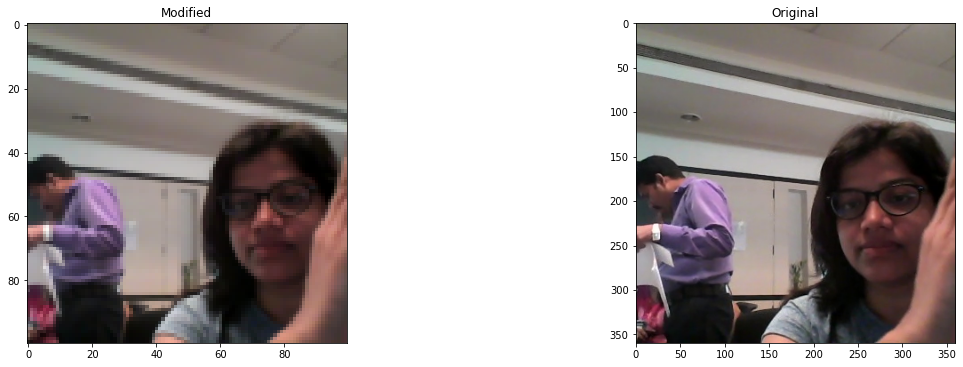

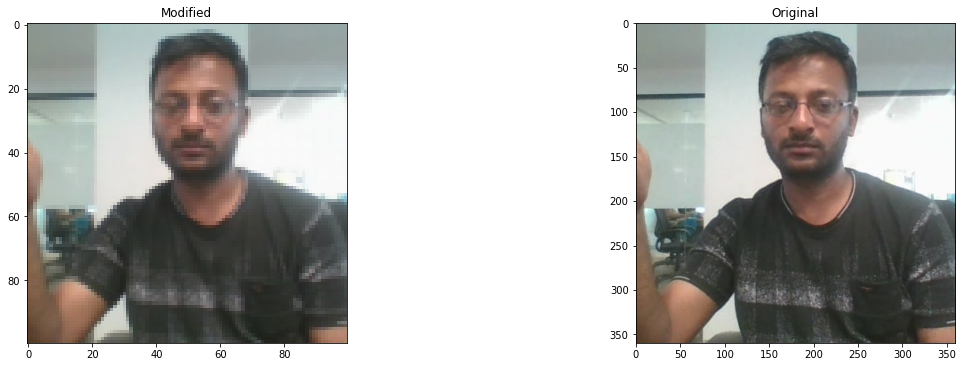

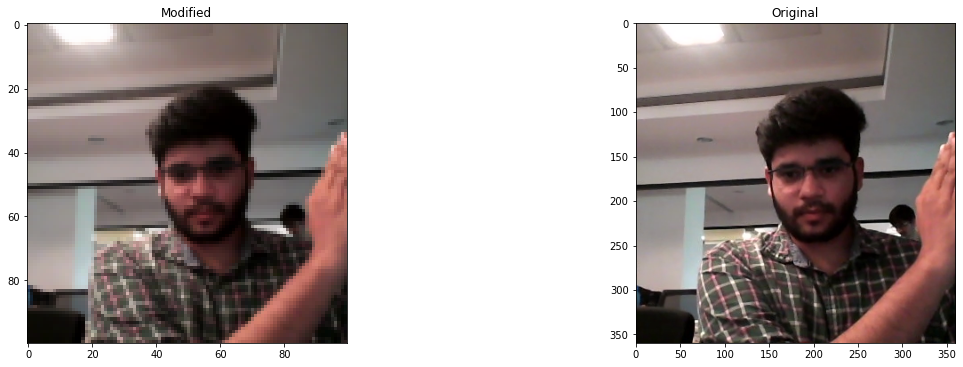

In [ ]:
# plot few images to check if the images are resized
visualize_resize_image(['/tmp/Project_data/train/WIN_20180907_15_35_09_Pro_Right Swipe_new/WIN_20180907_15_35_09_Pro_00012.png','/tmp/Project_data/train/WIN_20180907_15_38_17_Pro_Left Swipe_new_Left Swipe_new/WIN_20180907_15_38_17_Pro_00029.png', '/tmp/Project_data/train/WIN_20180907_15_38_24_Pro_Right Swipe_new/WIN_20180907_15_38_24_Pro_00013.png'])

## Generator Function

In [15]:
img_idx = np.round(np.linspace(0, total_frames - 1, number_of_frames)).astype(int)#create a list of image numbers you want to use for a particular video
def generator(source_path, folder_list, batch_size):
    print( 'Source path = ', source_path, '; batch size =', batch_size)
    
    while True:
        t = np.random.permutation(folder_list)
        num_batches = len(folder_list) // batch_size # calculate the number of batches
        for batch in range(num_batches): # we iterate over the number of batches
            batch_data = np.zeros((batch_size,len(img_idx),image_height,image_width,3)) # img_dx is the number of images you use for each video, (image_height,image_width) is the final size of the input images and 3 is the number of channels RGB
            batch_labels = np.zeros((batch_size, labels)) # batch_labels is the one hot representation of the output
            for folder in range(batch_size): # iterate over the batch_size
                imgs = os.listdir(source_path+'/'+ t[folder + (batch*batch_size)].split(';')[0]) # read all the images in the folder
                for idx,item in enumerate(img_idx): #  Iterate over the frames/images of a folder to read them in
                    image = imread(source_path+'/'+ t[folder + (batch*batch_size)].strip().split(';')[0]+'/'+imgs[item]).astype(np.float32)
                    
                    # resize images to (100,100)
                    image = resize_image(image)

                    batch_data[folder,idx,:,:,0] = image[:,:,0]/255   #normalise and feed in the image
                    batch_data[folder,idx,:,:,1] = image[:,:,1]/255   #normalise and feed in the image
                    batch_data[folder,idx,:,:,2] = image[:,:,2]/255   #normalise and feed in the image
                    
                batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
            yield batch_data, batch_labels     #you yield the batch_data and the batch_labels

        
        # code for the remaining data points which are left after full batches
        if (len(folder_list) != batch_size * num_batches):
            batch_size = len(folder_list) - (batch_size*num_batches)
            
            for batch in range(batch_size): # we iterate over the number of batches
                batch_data = np.zeros((batch_size, len(img_idx), image_height, image_width, 3)) # img_idx is the number of images you use for each video, (image_height,image_width) is the final size of the input images and 3 is the number of channels RGB
                batch_labels = np.zeros((batch_size, labels)) # batch_labels is the one hot representation of the output
                for folder in range(batch_size): # iterate over the batch_size
                    imgs = os.listdir(source_path+'/'+ t[folder + (batch*batch_size)].split(';')[0]) # read all the images in the folder
                    for idx,item in enumerate(img_idx): #  Iterate over the frames/images of a folder to read them in
                        image = imread(source_path+'/'+ t[folder + (batch*batch_size)].strip().split(';')[0]+'/'+imgs[item]).astype(np.float32)
                    
                        # resize images to (100,100)
                        image = resize_image(image)
                                         
                        batch_data[folder,idx,:,:,0] = image[:,:,0]/255   #normalise and feed in the image
                        batch_data[folder,idx,:,:,1] = image[:,:,1]/255   #normalise and feed in the image
                        batch_data[folder,idx,:,:,2] = image[:,:,2]/255   #normalise and feed in the image
                    
                    batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
                yield batch_data, batch_labels    #you yield the batch_data and the batch_labels

Note here that a video is represented above in the generator as (number of images, height, width, number of channels). Take this into consideration while creating the model architecture.

In [16]:
curr_dt_time = datetime.datetime.now()
train_path = '/tmp/Project_data/train'
val_path = '/tmp/Project_data/val'
num_train_sequences = len(train_doc)
print('# training sequences =', num_train_sequences)
num_val_sequences = len(val_doc)
print('# validation sequences =', num_val_sequences)
num_epochs = 25  # specify the number of epochs
print ('# epochs =', num_epochs)

# training sequences = 663
# validation sequences = 100
# epochs = 25


## Model 0
Model with batch size=80 image resolution as (160,160) and 30 frames

In [17]:
from keras.models import Sequential, Model
from keras.layers import Dense, GRU, Flatten, Dropout, TimeDistributed, Flatten, BatchNormalization, Activation
from keras.layers.convolutional import Conv3D, MaxPooling3D
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from keras import optimizers


model = Sequential()

model.add(Conv3D(8, kernel_size=(3,3,3), input_shape=(len(img_idx), image_height, image_width, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Conv3D(16, kernel_size=(3,3,3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Conv3D(32, kernel_size=(3,3,3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Flatten())
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.25))

model.add(Dense(64, activation='relu'))
model.add(Dropout(0.25))

#softmax layer
model.add(Dense(labels, activation='softmax'))


In [18]:
# compile the model with SGD optimizer
optimiser = optimizers.SGD(lr=0.001, decay=1e-6, momentum=0.7, nesterov=True) 
model.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
print (model.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv3d (Conv3D)             (None, 30, 160, 160, 8)   656       
                                                                 
 batch_normalization (BatchN  (None, 30, 160, 160, 8)  32        
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 30, 160, 160, 8)   0         
                                                                 
 max_pooling3d (MaxPooling3D  (None, 15, 80, 80, 8)    0         
 )                                                               
                                                                 
 conv3d_1 (Conv3D)           (None, 15, 80, 80, 16)    3472      
                                                                 
 batch_normalization_1 (Batc  (None, 15, 80, 80, 16)  

/usr/local/lib/python3.8/dist-packages/keras/optimizers/optimizer_v2/gradient_descent.py:108: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(SGD, self).__init__(name, **kwargs)


In [19]:
train_generator = generator(train_path, train_doc, batch_size)
val_generator = generator(val_path, val_doc, batch_size)


In [20]:
model_name = 'model_init' + '_' + str(curr_dt_time).replace(' ','').replace(':','_') + '/'
    
if not os.path.exists(model_name):
    os.mkdir(model_name)
        
filepath = model_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.h5'

checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=False, save_weights_only=False, mode='auto', period=1)

LR = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, cooldown=1, verbose=1) # write the REducelronplateau code
callbacks_list = [checkpoint, LR]



In [21]:
if (num_train_sequences%batch_size) == 0:
    steps_per_epoch = int(num_train_sequences/batch_size)
else:
    steps_per_epoch = (num_train_sequences//batch_size) + 1

if (num_val_sequences%batch_size) == 0:
    validation_steps = int(num_val_sequences/batch_size)
else:
    validation_steps = (num_val_sequences//batch_size) + 1

In [23]:
# fit the model. This will start training the model and with the help of the checkpoints, you'll be able to save the model at the end of each epoch.
history = model.fit(train_generator, steps_per_epoch=steps_per_epoch, epochs=num_epochs, verbose=1, 
                     validation_data=val_generator, 
                    validation_steps=validation_steps, class_weight=None, workers=1, initial_epoch=0)

## Observation -
Using batch size of 80 and image resolution of (160,160) with 30 frames gave below error - 
 **ResourceExhaustedError Node: 'gradient_tape/sequential_1/max_pooling3d/MaxPool3D/MaxPool3DGrad'
OOM when allocating tensor with shape[80,8,30,160,160] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc**

## Model 1
Conv3D model with batch size=20 and epochs=25

In [ ]:
batch_size = 20 
labels = 5
image_height = 100
image_width = 100
number_of_frames = 15
total_frames = 30

In [ ]:
from keras.models import Sequential, Model
from keras.layers import Dense, GRU, Flatten, Dropout, TimeDistributed, Flatten, BatchNormalization, Activation
from keras.layers.convolutional import Conv3D, MaxPooling3D
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from keras import optimizers


model = Sequential()

model.add(Conv3D(8, kernel_size=(3,3,3), input_shape=(len(img_idx), image_height, image_width, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Conv3D(16, kernel_size=(3,3,3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Conv3D(32, kernel_size=(3,3,3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Flatten())
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.25))

model.add(Dense(64, activation='relu'))
model.add(Dropout(0.25))

#softmax layer
model.add(Dense(labels, activation='softmax'))


In [ ]:
# compile the model with SGD optimizer
optimiser = optimizers.SGD(lr=0.001, decay=1e-6, momentum=0.7, nesterov=True) 
model.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
print (model.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv3d_3 (Conv3D)           (None, 15, 100, 100, 8)   656       
                                                                 
 batch_normalization_3 (Batc  (None, 15, 100, 100, 8)  32        
 hNormalization)                                                 
                                                                 
 activation_3 (Activation)   (None, 15, 100, 100, 8)   0         
                                                                 
 max_pooling3d_3 (MaxPooling  (None, 7, 50, 50, 8)     0         
 3D)                                                             
                                                                 
 conv3d_4 (Conv3D)           (None, 7, 50, 50, 16)     3472      
                                                                 
 batch_normalization_4 (Batc  (None, 7, 50, 50, 16)   

Let us create the `train_generator` and the `val_generator` which will be used in `.fit_generator`.

In [ ]:
train_generator = generator(train_path, train_doc, batch_size)
val_generator = generator(val_path, val_doc, batch_size)

In [ ]:
model_name = 'model_init' + '_' + str(curr_dt_time).replace(' ','').replace(':','_') + '/'
    
if not os.path.exists(model_name):
    os.mkdir(model_name)
        
filepath = model_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.h5'

checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=False, save_weights_only=False, mode='auto', period=1)

LR = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, cooldown=1, verbose=1) # write the REducelronplateau code
callbacks_list = [checkpoint, LR]

The `steps_per_epoch` and `validation_steps` are used by `fit_generator` to decide the number of next() calls it need to make.

In [ ]:
if (num_train_sequences%batch_size) == 0:
    steps_per_epoch = int(num_train_sequences/batch_size)
else:
    steps_per_epoch = (num_train_sequences//batch_size) + 1

if (num_val_sequences%batch_size) == 0:
    validation_steps = int(num_val_sequences/batch_size)
else:
    validation_steps = (num_val_sequences//batch_size) + 1

In [ ]:
# fit the model. This will start training the model and with the help of the checkpoints, you'll be able to save the model at the end of each epoch.
history = model.fit(train_generator, steps_per_epoch=steps_per_epoch, epochs=num_epochs, verbose=1, 
                    callbacks=callbacks_list, validation_data=val_generator, 
                    validation_steps=validation_steps, class_weight=None, workers=1, initial_epoch=0)

Source path =  /tmp/Project_data/train ; batch size = 20
Epoch 1/25
34/34 [==============================] - ETA: 0s - loss: 1.6869 - categorical_accuracy: 0.2489Source path =  /tmp/Project_data/val ; batch size = 20

Epoch 1: saving model to model_init_2023-01-0504_39_14.265515/model-00001-1.68695-0.24887-1.59516-0.30000.h5
34/34 [==============================] - 100s 3s/step - loss: 1.6869 - categorical_accuracy: 0.2489 - val_loss: 1.5952 - val_categorical_accuracy: 0.3000 - lr: 0.0010
Epoch 2/25
34/34 [==============================] - ETA: 0s - loss: 1.6626 - categorical_accuracy: 0.2647
Epoch 2: saving model to model_init_2023-01-0504_39_14.265515/model-00002-1.66264-0.26471-1.60853-0.21000.h5
34/34 [==============================] - 34s 1s/step - loss: 1.6626 - categorical_accuracy: 0.2647 - val_loss: 1.6085 - val_categorical_accuracy: 0.2100 - lr: 0.0010
Epoch 3/25
34/34 [==============================] - ETA: 0s - loss: 1.5568 - categorical_accuracy: 0.3529
Epoch 3: saving mod

**Training Accuracy:** 0.48%

**Validation Accuracy:** 0.52%

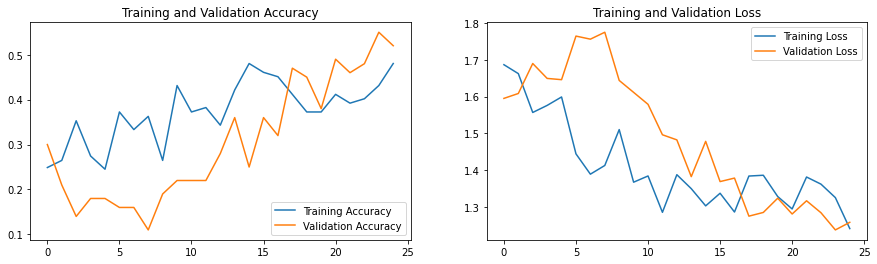

In [ ]:
from IPython.display import Markdown, display

# function to visualize training and validation accuracy
def plot_history(history):
    display(Markdown("**Training Accuracy:** " + str(round(history.history['categorical_accuracy'][num_epochs-1], 2)) + "%"))
    display(Markdown("**Validation Accuracy:** " + str(round(history.history['val_categorical_accuracy'][num_epochs-1], 2)) + "%"))
  
    acc = history.history['categorical_accuracy']
    val_acc = history.history['val_categorical_accuracy']

    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs_range = range(num_epochs)

    plt.figure(figsize=(15, 4))
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Training Accuracy')
    plt.plot(epochs_range, val_acc, label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.title('Training and Validation Accuracy')

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Training Loss')
    plt.plot(epochs_range, val_loss, label='Validation Loss')
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')
    plt.show()

plot_history(history)

## Observations
1. The validation accuracy started increasing after epoch 18
2. The model is underfitting 

## Model 2
Decrease batch size to 8 to increase accuracy

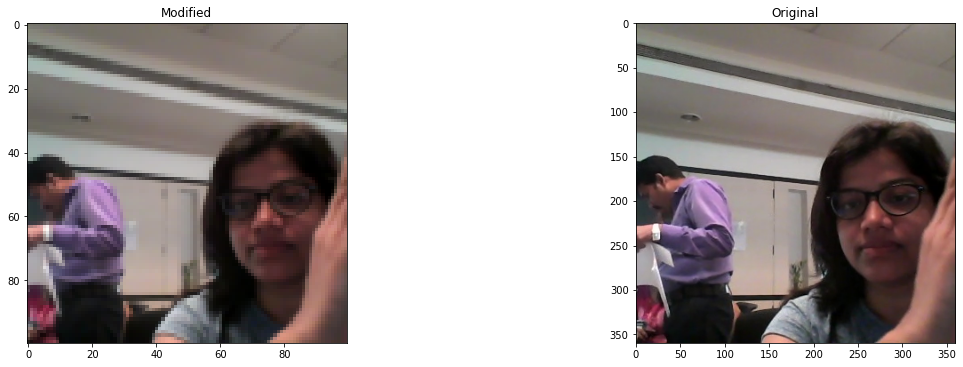

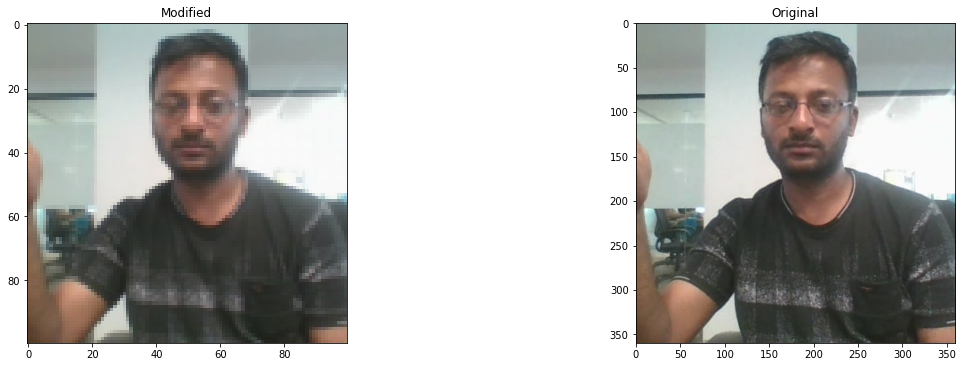

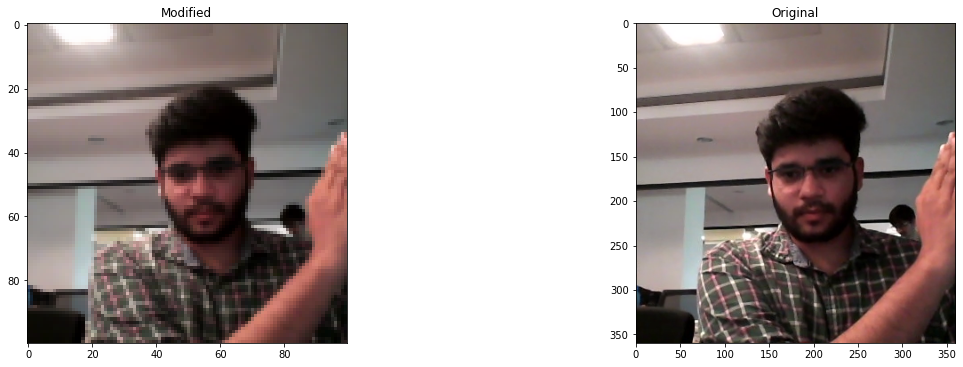

In [ ]:
# change batch size to 8
total_frames = 30
number_of_frames = 15
labels = 5
image_height = 100
image_width = 100
img_idx = np.round(np.linspace(0, total_frames-1, number_of_frames)).astype(int)
batch_size = 8

num_epochs=25

visualize_resize_image(['/tmp/Project_data/train/WIN_20180907_15_35_09_Pro_Right Swipe_new/WIN_20180907_15_35_09_Pro_00012.png','/tmp/Project_data/train/WIN_20180907_15_38_17_Pro_Left Swipe_new_Left Swipe_new/WIN_20180907_15_38_17_Pro_00029.png', '/tmp/Project_data/train/WIN_20180907_15_38_24_Pro_Right Swipe_new/WIN_20180907_15_38_24_Pro_00013.png'])

In [ ]:
from keras.models import Sequential, Model
from keras.layers import Dense, GRU, Flatten, Dropout, TimeDistributed, Flatten, BatchNormalization, Activation
from keras.layers.convolutional import Conv3D, MaxPooling3D
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from keras import optimizers

model = Sequential()

model.add(Conv3D(8, kernel_size=(3,3,3), input_shape=(len(img_idx), image_height, image_width, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Conv3D(16, kernel_size=(3,3,3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Conv3D(32, kernel_size=(3,3,3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Flatten())
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.25))

model.add(Dense(64, activation='relu'))
model.add(Dropout(0.25))

#softmax layer
model.add(Dense(labels, activation='softmax'))


In [ ]:
# compile the model with SGD optimizer
optimiser = optimizers.SGD(lr=0.001, decay=1e-6, momentum=0.7, nesterov=True) #write your optimizer
model.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
print (model.summary())

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv3d_9 (Conv3D)           (None, 15, 100, 100, 8)   656       
                                                                 
 batch_normalization_9 (Batc  (None, 15, 100, 100, 8)  32        
 hNormalization)                                                 
                                                                 
 activation_9 (Activation)   (None, 15, 100, 100, 8)   0         
                                                                 
 max_pooling3d_9 (MaxPooling  (None, 7, 50, 50, 8)     0         
 3D)                                                             
                                                                 
 conv3d_10 (Conv3D)          (None, 7, 50, 50, 16)     3472      
                                                                 
 batch_normalization_10 (Bat  (None, 7, 50, 50, 16)   

In [ ]:
train_generator = generator(train_path, train_doc, batch_size)
val_generator = generator(val_path, val_doc, batch_size)

In [ ]:
model_name = 'model_init' + '_' + str(curr_dt_time).replace(' ','').replace(':','_') + '/'
    
if not os.path.exists(model_name):
    os.mkdir(model_name)
        
filepath = model_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.h5'

checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=False, save_weights_only=False, mode='auto', period=1)

LR = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, cooldown=1, verbose=1) # write the REducelronplateau code here
callbacks_list = [checkpoint, LR]

In [ ]:
if (num_train_sequences%batch_size) == 0:
    steps_per_epoch = int(num_train_sequences/batch_size)
else:
    steps_per_epoch = (num_train_sequences//batch_size) + 1

if (num_val_sequences%batch_size) == 0:
    validation_steps = int(num_val_sequences/batch_size)
else:
    validation_steps = (num_val_sequences//batch_size) + 1

In [ ]:
# fit the model. This will start training the model and with the help of the checkpoints, you'll be able to save the model at the end of each epoch.
history = model.fit(train_generator, steps_per_epoch=steps_per_epoch, epochs=num_epochs, verbose=1, 
                    callbacks=callbacks_list, validation_data=val_generator, 
                    validation_steps=validation_steps, class_weight=None, workers=1, initial_epoch=0)

Source path =  /tmp/Project_data/train ; batch size = 8
Epoch 1/25
83/83 [==============================] - ETA: 0s - loss: 1.6594 - categorical_accuracy: 0.2624Source path =  /tmp/Project_data/val ; batch size = 8

Epoch 1: saving model to model_init_2023-01-0504_39_14.265515/model-00001-1.65941-0.26244-1.59758-0.32000.h5
83/83 [==============================] - 104s 1s/step - loss: 1.6594 - categorical_accuracy: 0.2624 - val_loss: 1.5976 - val_categorical_accuracy: 0.3200 - lr: 0.0010
Epoch 2/25
83/83 [==============================] - ETA: 0s - loss: 1.4072 - categorical_accuracy: 0.3787
Epoch 2: saving model to model_init_2023-01-0504_39_14.265515/model-00002-1.40722-0.37866-1.54486-0.21154.h5
83/83 [==============================] - 81s 983ms/step - loss: 1.4072 - categorical_accuracy: 0.3787 - val_loss: 1.5449 - val_categorical_accuracy: 0.2115 - lr: 0.0010
Epoch 3/25
83/83 [==============================] - ETA: 0s - loss: 1.3769 - categorical_accuracy: 0.3675
Epoch 3: saving mo

**Training Accuracy:** 0.69%

**Validation Accuracy:** 0.63%

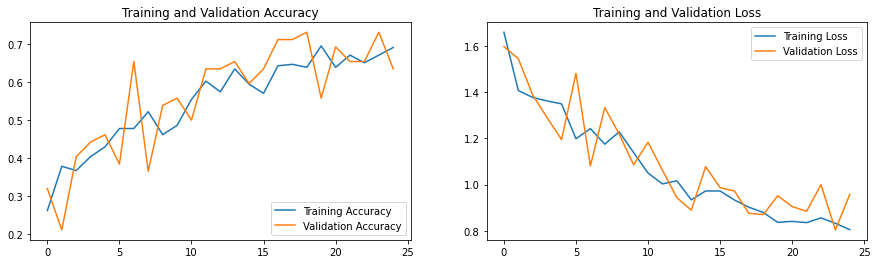

In [ ]:
plot_history(history)

## Observations
1. The model accuracy has increased from previous model
2. The training accuracy is more than validation accuracy

## Model 3
Change the optimizer to Adam optimizer

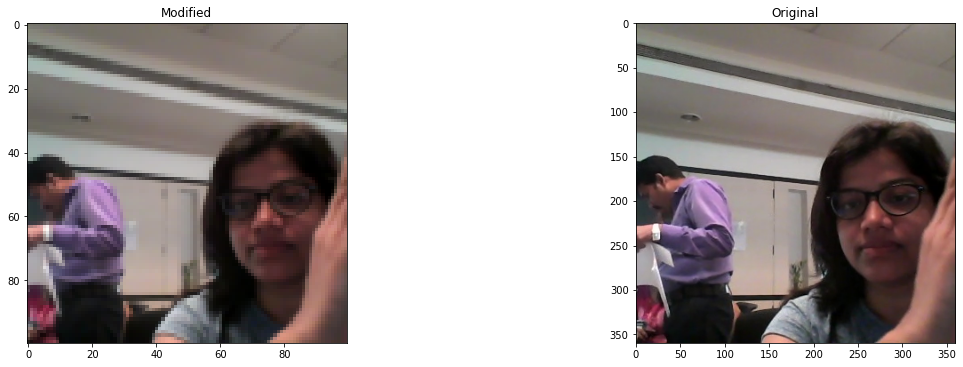

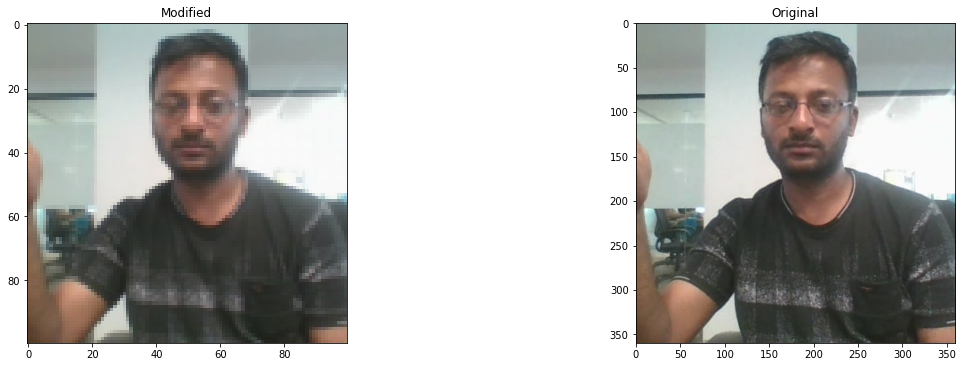

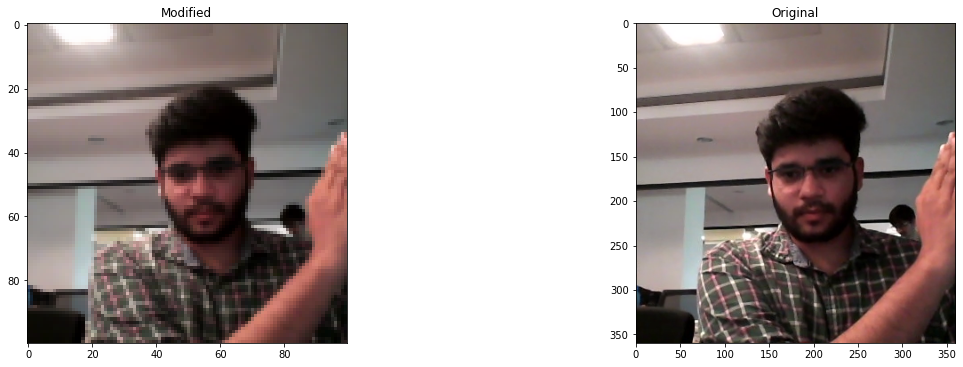

In [ ]:
total_frames = 30
number_of_frames = 15
labels = 5
image_height = 100
image_width = 100
img_idx = np.round(np.linspace(0, total_frames-1, number_of_frames)).astype(int)
batch_size = 8

num_epochs=25

visualize_resize_image(['/tmp/Project_data/train/WIN_20180907_15_35_09_Pro_Right Swipe_new/WIN_20180907_15_35_09_Pro_00012.png','/tmp/Project_data/train/WIN_20180907_15_38_17_Pro_Left Swipe_new_Left Swipe_new/WIN_20180907_15_38_17_Pro_00029.png', '/tmp/Project_data/train/WIN_20180907_15_38_24_Pro_Right Swipe_new/WIN_20180907_15_38_24_Pro_00013.png'])

In [ ]:
from keras.models import Sequential, Model
from keras.layers import Dense, GRU, Flatten, Dropout, TimeDistributed, Flatten, BatchNormalization, Activation
from keras.layers.convolutional import Conv3D, MaxPooling3D
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from keras import optimizers

model = Sequential()

model.add(Conv3D(8, kernel_size=(3,3,3), input_shape=(len(img_idx), image_height, image_width, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Conv3D(16, kernel_size=(3,3,3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Conv3D(32, kernel_size=(3,3,3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Flatten())
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.25))

model.add(Dense(64, activation='relu'))
model.add(Dropout(0.25))

#softmax layer
model.add(Dense(labels, activation='softmax'))


In [ ]:
# compile the model with adam optimizer
optimiser = optimizers.Adam()
model.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
print (model.summary())

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv3d_15 (Conv3D)          (None, 15, 100, 100, 8)   656       
                                                                 
 batch_normalization_15 (Bat  (None, 15, 100, 100, 8)  32        
 chNormalization)                                                
                                                                 
 activation_15 (Activation)  (None, 15, 100, 100, 8)   0         
                                                                 
 max_pooling3d_15 (MaxPoolin  (None, 7, 50, 50, 8)     0         
 g3D)                                                            
                                                                 
 conv3d_16 (Conv3D)          (None, 7, 50, 50, 16)     3472      
                                                                 
 batch_normalization_16 (Bat  (None, 7, 50, 50, 16)   

In [ ]:
train_generator = generator(train_path, train_doc, batch_size)
val_generator = generator(val_path, val_doc, batch_size)

In [ ]:
model_name = 'model_exp4_' + str(curr_dt_time).replace(' ','').replace(':','_') + '/'
    
if not os.path.exists(model_name):
    os.mkdir(model_name)
        
filepath = model_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.h5'

checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=False, mode='auto',save_freq = "epoch")

LR = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, cooldown=1, verbose=1) # write the REducelronplateau code here
callbacks_list = [checkpoint, LR]

In [ ]:
if (num_train_sequences%batch_size) == 0:
    steps_per_epoch = int(num_train_sequences/batch_size)
else:
    steps_per_epoch = (num_train_sequences//batch_size) + 1

if (num_val_sequences%batch_size) == 0:
    validation_steps = int(num_val_sequences/batch_size)
else:
    validation_steps = (num_val_sequences//batch_size) + 1

In [ ]:
# fit the model. This will start training the model and with the help of the checkpoints, you'll be able to save the model at the end of each epoch.
history = model.fit(train_generator, steps_per_epoch=steps_per_epoch, epochs=num_epochs, verbose=1, 
                    callbacks=callbacks_list, validation_data=val_generator, 
                    validation_steps=validation_steps, class_weight=None, workers=1, initial_epoch=0)

Source path =  /tmp/Project_data/train ; batch size = 8
Epoch 1/25
83/83 [==============================] - ETA: 0s - loss: 1.6579 - categorical_accuracy: 0.3077Source path =  /tmp/Project_data/val ; batch size = 8

Epoch 1: val_loss improved from inf to 1.60019, saving model to model_exp4_2023-01-0504_39_14.265515/model-00001-1.65794-0.30769-1.60019-0.24000.h5
83/83 [==============================] - 105s 1s/step - loss: 1.6579 - categorical_accuracy: 0.3077 - val_loss: 1.6002 - val_categorical_accuracy: 0.2400 - lr: 0.0010
Epoch 2/25
83/83 [==============================] - ETA: 0s - loss: 1.4222 - categorical_accuracy: 0.3666
Epoch 2: val_loss did not improve from 1.60019
83/83 [==============================] - 80s 973ms/step - loss: 1.4222 - categorical_accuracy: 0.3666 - val_loss: 1.6168 - val_categorical_accuracy: 0.2500 - lr: 0.0010
Epoch 3/25
83/83 [==============================] - ETA: 0s - loss: 1.3897 - categorical_accuracy: 0.3742
Epoch 3: val_loss improved from 1.60019 t

**Training Accuracy:** 0.65%

**Validation Accuracy:** 0.71%

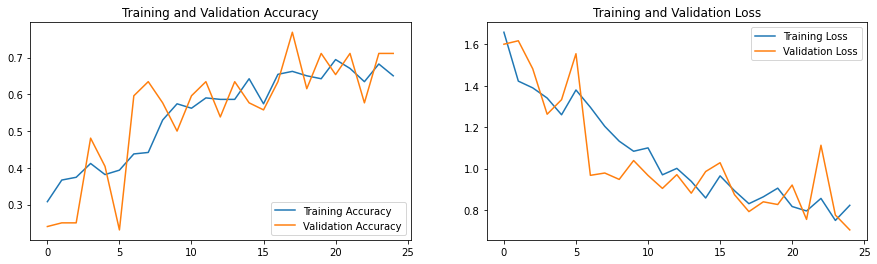

In [ ]:
plot_history(history)

## Observations
1. The validation accuracy has increased 
2. The model is underfitting so increase number of parameters

## Model 4
Increase number of neurons in dense layer

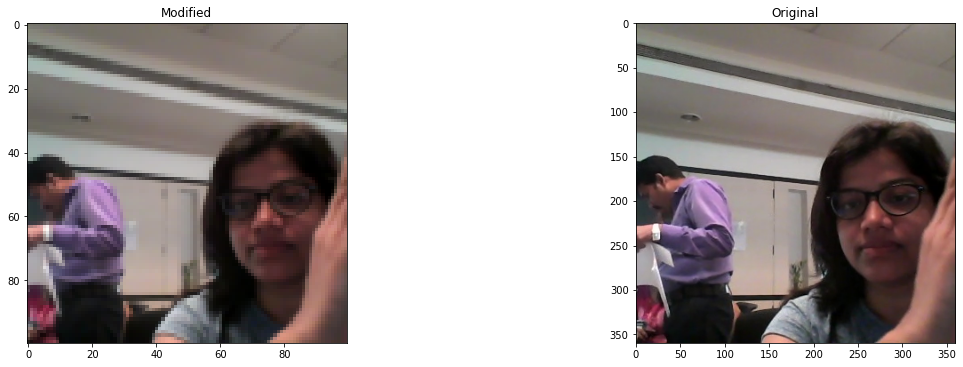

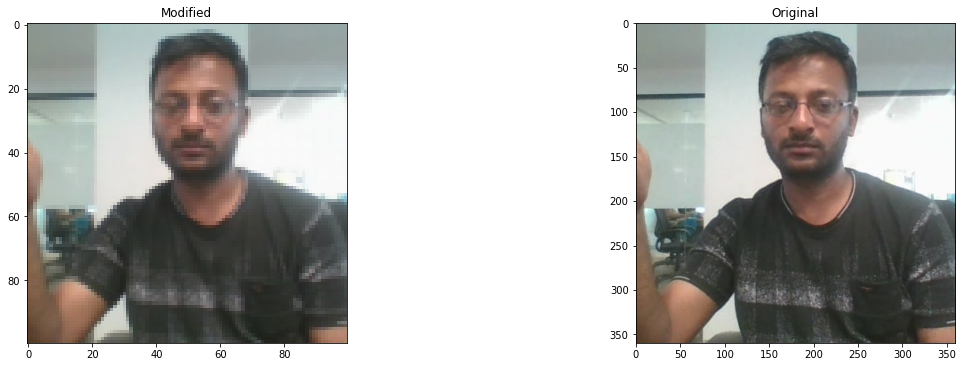

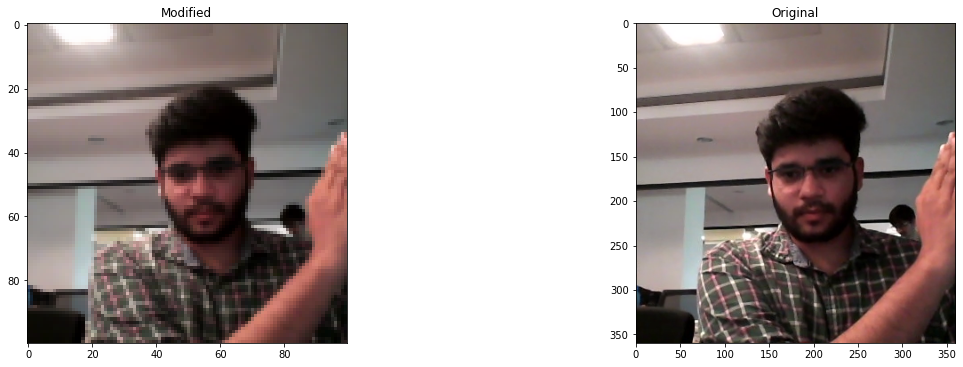

In [ ]:
total_frames = 30
number_of_frames = 15
labels = 5
image_height = 100
image_width = 100
img_idx = np.round(np.linspace(0, total_frames-1, number_of_frames)).astype(int)
batch_size = 8

num_epochs=25

visualize_resize_image(['/tmp/Project_data/train/WIN_20180907_15_35_09_Pro_Right Swipe_new/WIN_20180907_15_35_09_Pro_00012.png','/tmp/Project_data/train/WIN_20180907_15_38_17_Pro_Left Swipe_new_Left Swipe_new/WIN_20180907_15_38_17_Pro_00029.png', '/tmp/Project_data/train/WIN_20180907_15_38_24_Pro_Right Swipe_new/WIN_20180907_15_38_24_Pro_00013.png'])

In [ ]:
from keras.models import Sequential, Model
from keras.layers import Dense, GRU, Flatten, Dropout, TimeDistributed, Flatten, BatchNormalization, Activation
from keras.layers.convolutional import Conv3D, MaxPooling3D
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from keras import optimizers

model = Sequential()

model.add(Conv3D(16, kernel_size=(3,3,3), input_shape=(len(img_idx), image_height, image_width, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Conv3D(32, kernel_size=(3,3,3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Conv3D(64, kernel_size=(3,3,3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.25))

model.add(Dense(128, activation='relu'))
model.add(Dropout(0.25))

#softmax layer
model.add(Dense(labels, activation='softmax'))


In [ ]:
# compile the model with Adam optimizer
optimiser = optimizers.Adam()
model.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
print (model.summary())

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv3d_18 (Conv3D)          (None, 15, 100, 100, 16)  1312      
                                                                 
 batch_normalization_18 (Bat  (None, 15, 100, 100, 16)  64       
 chNormalization)                                                
                                                                 
 activation_18 (Activation)  (None, 15, 100, 100, 16)  0         
                                                                 
 max_pooling3d_18 (MaxPoolin  (None, 7, 50, 50, 16)    0         
 g3D)                                                            
                                                                 
 conv3d_19 (Conv3D)          (None, 7, 50, 50, 32)     13856     
                                                                 
 batch_normalization_19 (Bat  (None, 7, 50, 50, 32)   

In [ ]:
train_generator = generator(train_path, train_doc, batch_size)
val_generator = generator(val_path, val_doc, batch_size)

In [ ]:
model_name = 'model_exp4_' + str(curr_dt_time).replace(' ','').replace(':','_') + '/'
    
if not os.path.exists(model_name):
    os.mkdir(model_name)
        
filepath = model_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.h5'

checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=False, mode='auto',save_freq = "epoch")

LR = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, cooldown=1, verbose=1) # write the REducelronplateau code here
callbacks_list = [checkpoint, LR]

In [ ]:
if (num_train_sequences%batch_size) == 0:
    steps_per_epoch = int(num_train_sequences/batch_size)
else:
    steps_per_epoch = (num_train_sequences//batch_size) + 1

if (num_val_sequences%batch_size) == 0:
    validation_steps = int(num_val_sequences/batch_size)
else:
    validation_steps = (num_val_sequences//batch_size) + 1

In [ ]:
# fit the model. This will start training the model and with the help of the checkpoints, you'll be able to save the model at the end of each epoch.
history = model.fit(train_generator, steps_per_epoch=steps_per_epoch, epochs=num_epochs, verbose=1, 
                    callbacks=callbacks_list, validation_data=val_generator, 
                    validation_steps=validation_steps, class_weight=None, workers=1, initial_epoch=0)

Source path =  /tmp/Project_data/train ; batch size = 8
Epoch 1/25
83/83 [==============================] - ETA: 0s - loss: 2.1664 - categorical_accuracy: 0.2971Source path =  /tmp/Project_data/val ; batch size = 8

Epoch 1: val_loss improved from inf to 1.88135, saving model to model_exp4_2023-01-0504_39_14.265515/model-00001-2.16639-0.29713-1.88135-0.17000.h5
83/83 [==============================] - 106s 1s/step - loss: 2.1664 - categorical_accuracy: 0.2971 - val_loss: 1.8814 - val_categorical_accuracy: 0.1700 - lr: 0.0010
Epoch 2/25
83/83 [==============================] - ETA: 0s - loss: 1.2381 - categorical_accuracy: 0.4647
Epoch 2: val_loss did not improve from 1.88135
83/83 [==============================] - 82s 995ms/step - loss: 1.2381 - categorical_accuracy: 0.4647 - val_loss: 2.6467 - val_categorical_accuracy: 0.1346 - lr: 0.0010
Epoch 3/25
83/83 [==============================] - ETA: 0s - loss: 1.2231 - categorical_accuracy: 0.4566
Epoch 3: val_loss improved from 1.88135 t

**Training Accuracy:** 0.86%

**Validation Accuracy:** 0.75%

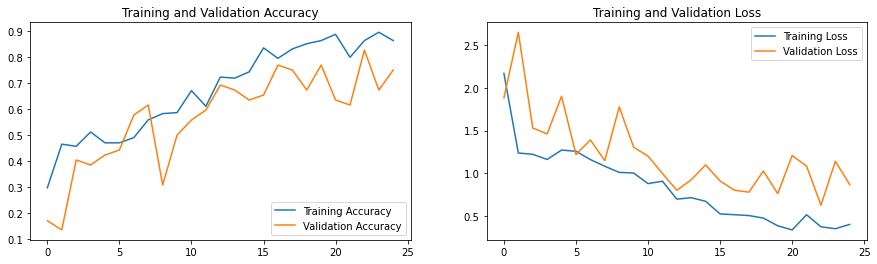

In [ ]:
plot_history(history)

## Observations
1. The accuracy is significantly increase than previous model
2. The model seems to overfit so increase dropout value

## Model 5
Increase dropout value in model

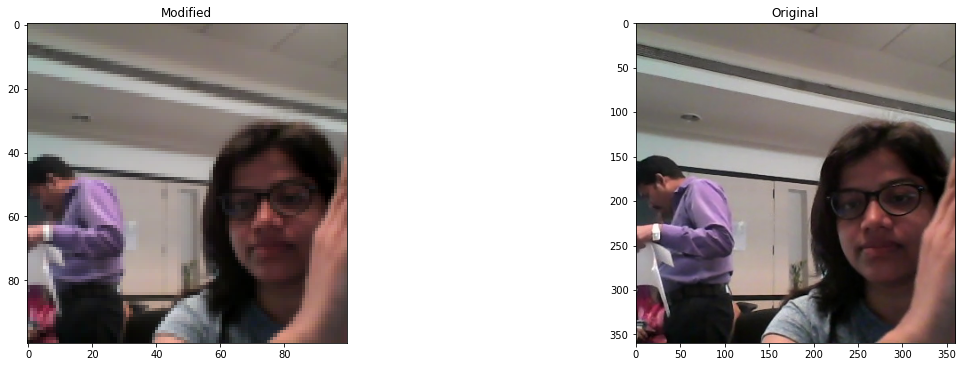

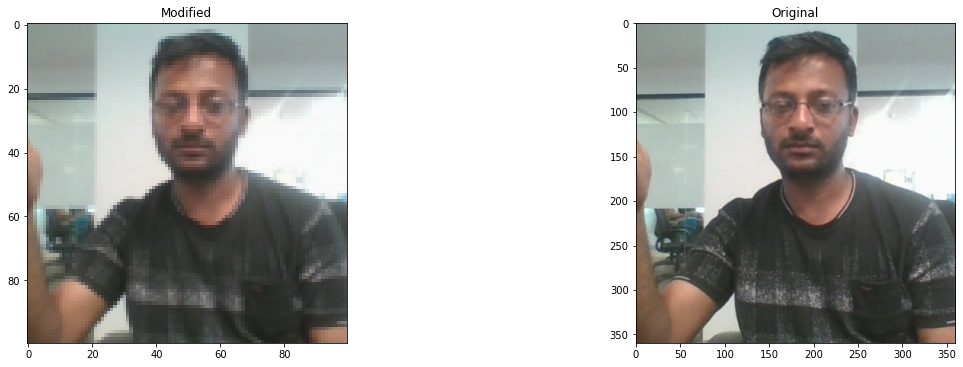

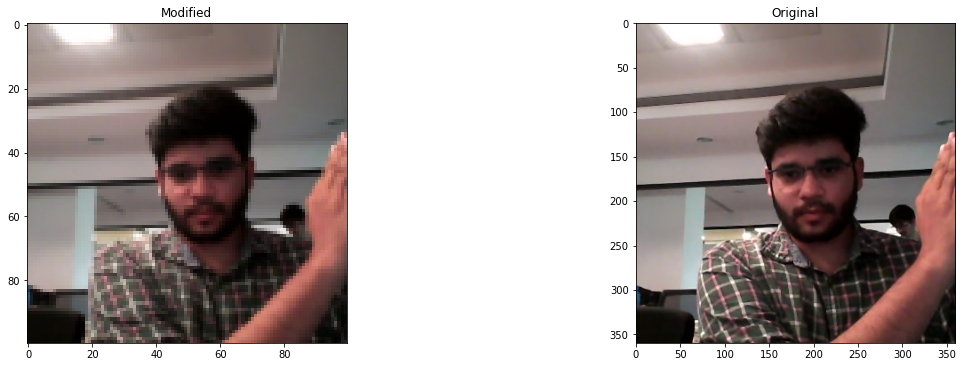

In [ ]:
total_frames = 30
number_of_frames = 15
labels = 5
image_height = 100
image_width = 100
img_idx = np.round(np.linspace(0, total_frames-1, number_of_frames)).astype(int)
batch_size = 8

num_epochs=25

visualize_resize_image(['/tmp/Project_data/train/WIN_20180907_15_35_09_Pro_Right Swipe_new/WIN_20180907_15_35_09_Pro_00012.png','/tmp/Project_data/train/WIN_20180907_15_38_17_Pro_Left Swipe_new_Left Swipe_new/WIN_20180907_15_38_17_Pro_00029.png', '/tmp/Project_data/train/WIN_20180907_15_38_24_Pro_Right Swipe_new/WIN_20180907_15_38_24_Pro_00013.png'])

In [ ]:
from keras.models import Sequential, Model
from keras.layers import Dense, GRU, Flatten, Dropout, TimeDistributed, Flatten, BatchNormalization, Activation
from keras.layers.convolutional import Conv3D, MaxPooling3D
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from keras import optimizers

model = Sequential()

model.add(Conv3D(16, kernel_size=(3,3,3), input_shape=(len(img_idx), image_height, image_width, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Conv3D(32, kernel_size=(3,3,3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Conv3D(64, kernel_size=(3,3,3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.35))

model.add(Dense(128, activation='relu'))
model.add(Dropout(0.35))

#softmax layer
model.add(Dense(labels, activation='softmax'))


In [ ]:
# compile the model with Adam optimizer
optimiser = optimizers.Adam()
model.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
print (model.summary())

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv3d_6 (Conv3D)           (None, 15, 100, 100, 16)  1312      
                                                                 
 batch_normalization_6 (Batc  (None, 15, 100, 100, 16)  64       
 hNormalization)                                                 
                                                                 
 activation_6 (Activation)   (None, 15, 100, 100, 16)  0         
                                                                 
 max_pooling3d_6 (MaxPooling  (None, 7, 50, 50, 16)    0         
 3D)                                                             
                                                                 
 conv3d_7 (Conv3D)           (None, 7, 50, 50, 32)     13856     
                                                                 
 batch_normalization_7 (Batc  (None, 7, 50, 50, 32)   

In [ ]:
train_generator = generator(train_path, train_doc, batch_size)
val_generator = generator(val_path, val_doc, batch_size)

In [ ]:
model_name = 'model_exp4_' + str(curr_dt_time).replace(' ','').replace(':','_') + '/'
    
if not os.path.exists(model_name):
    os.mkdir(model_name)
        
filepath = model_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.h5'

checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=False, mode='auto',save_freq = "epoch")

LR = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, cooldown=1, verbose=1) # write the REducelronplateau code here
callbacks_list = [checkpoint, LR]

In [ ]:
if (num_train_sequences%batch_size) == 0:
    steps_per_epoch = int(num_train_sequences/batch_size)
else:
    steps_per_epoch = (num_train_sequences//batch_size) + 1

if (num_val_sequences%batch_size) == 0:
    validation_steps = int(num_val_sequences/batch_size)
else:
    validation_steps = (num_val_sequences//batch_size) + 1

In [ ]:
# fit the model. This will start training the model and with the help of the checkpoints, you'll be able to save the model at the end of each epoch.
history = model.fit(train_generator, steps_per_epoch=steps_per_epoch, epochs=num_epochs, verbose=1, 
                    callbacks=callbacks_list, validation_data=val_generator, 
                    validation_steps=validation_steps, class_weight=None, workers=1, initial_epoch=0)

Source path =  /tmp/Project_data/train ; batch size = 8
Epoch 1/25
83/83 [==============================] - ETA: 0s - loss: 2.3325 - categorical_accuracy: 0.2278Source path =  /tmp/Project_data/val ; batch size = 8

Epoch 1: val_loss improved from inf to 1.49040, saving model to model_exp4_2023-01-0509_27_07.310402/model-00001-2.33246-0.22775-1.49040-0.32000.h5
83/83 [==============================] - 110s 1s/step - loss: 2.3325 - categorical_accuracy: 0.2278 - val_loss: 1.4904 - val_categorical_accuracy: 0.3200 - lr: 0.0010
Epoch 2/25
83/83 [==============================] - ETA: 0s - loss: 1.4566 - categorical_accuracy: 0.3270
Epoch 2: val_loss did not improve from 1.49040
83/83 [==============================] - 87s 1s/step - loss: 1.4566 - categorical_accuracy: 0.3270 - val_loss: 2.5850 - val_categorical_accuracy: 0.1923 - lr: 0.0010
Epoch 3/25
83/83 [==============================] - ETA: 0s - loss: 1.3146 - categorical_accuracy: 0.4410
Epoch 3: val_loss did not improve from 1.490

**Training Accuracy:** 0.67%

**Validation Accuracy:** 0.62%

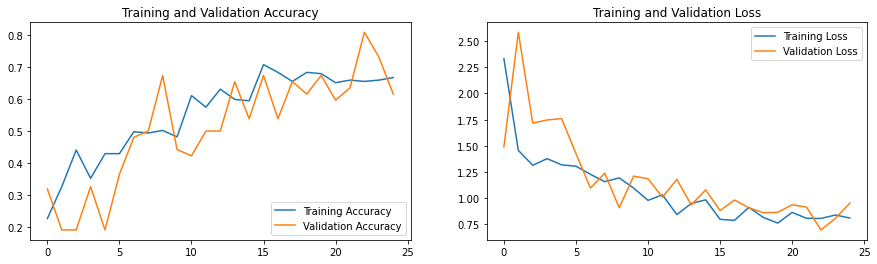

In [ ]:
plot_history(history)

## Observations
1. Overfitting is reduced by increasing dropout value
2. The accuracy has decreased to some extent

## Model 6
Decrease batch size to 5

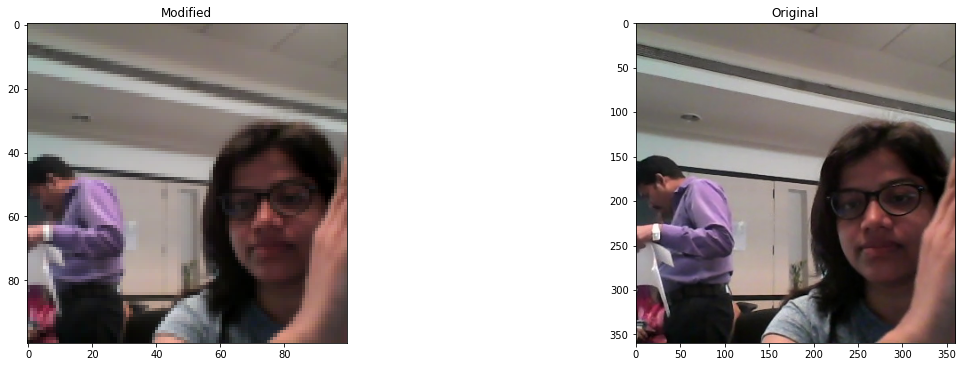

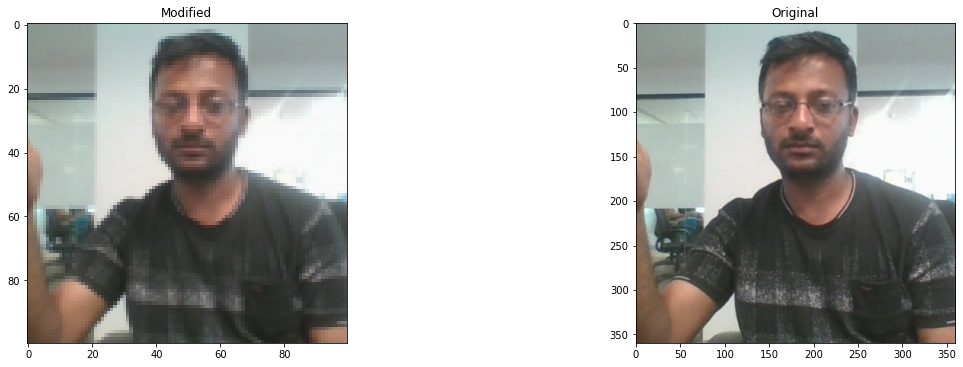

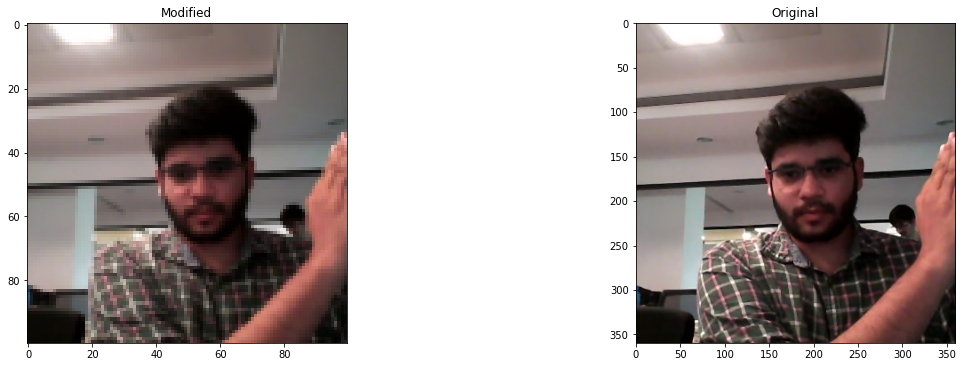

In [ ]:
total_frames = 30
number_of_frames = 15
labels = 5
image_height = 100
image_width = 100
img_idx = np.round(np.linspace(0, total_frames-1, number_of_frames)).astype(int)
batch_size = 5

num_epochs=25

visualize_resize_image(['/tmp/Project_data/train/WIN_20180907_15_35_09_Pro_Right Swipe_new/WIN_20180907_15_35_09_Pro_00012.png','/tmp/Project_data/train/WIN_20180907_15_38_17_Pro_Left Swipe_new_Left Swipe_new/WIN_20180907_15_38_17_Pro_00029.png', '/tmp/Project_data/train/WIN_20180907_15_38_24_Pro_Right Swipe_new/WIN_20180907_15_38_24_Pro_00013.png'])

In [ ]:
from keras.models import Sequential, Model
from keras.layers import Dense, GRU, Flatten, Dropout, TimeDistributed, Flatten, BatchNormalization, Activation
from keras.layers.convolutional import Conv3D, MaxPooling3D
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from keras import optimizers

model = Sequential()

model.add(Conv3D(16, kernel_size=(3,3,3), input_shape=(len(img_idx), image_height, image_width, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Conv3D(32, kernel_size=(3,3,3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Conv3D(64, kernel_size=(3,3,3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.35))

model.add(Dense(128, activation='relu'))
model.add(Dropout(0.35))

#softmax layer
model.add(Dense(labels, activation='softmax'))


In [ ]:
# compile the model with Adam optimizer
optimiser = optimizers.Adam()
model.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
print (model.summary())

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv3d_9 (Conv3D)           (None, 15, 100, 100, 16)  1312      
                                                                 
 batch_normalization_9 (Batc  (None, 15, 100, 100, 16)  64       
 hNormalization)                                                 
                                                                 
 activation_9 (Activation)   (None, 15, 100, 100, 16)  0         
                                                                 
 max_pooling3d_9 (MaxPooling  (None, 7, 50, 50, 16)    0         
 3D)                                                             
                                                                 
 conv3d_10 (Conv3D)          (None, 7, 50, 50, 32)     13856     
                                                                 
 batch_normalization_10 (Bat  (None, 7, 50, 50, 32)   

In [ ]:
model_name = 'model_exp4_' + str(curr_dt_time).replace(' ','').replace(':','_') + '/'
    
if not os.path.exists(model_name):
    os.mkdir(model_name)
        
filepath = model_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.h5'

checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=False, mode='auto',save_freq = "epoch")

LR = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, cooldown=1, verbose=1) # write the REducelronplateau code here
callbacks_list = [checkpoint, LR]

In [ ]:
if (num_train_sequences%batch_size) == 0:
    steps_per_epoch = int(num_train_sequences/batch_size)
else:
    steps_per_epoch = (num_train_sequences//batch_size) + 1

if (num_val_sequences%batch_size) == 0:
    validation_steps = int(num_val_sequences/batch_size)
else:
    validation_steps = (num_val_sequences//batch_size) + 1

In [ ]:
# fit the model. This will start training the model and with the help of the checkpoints, you'll be able to save the model at the end of each epoch.
history = model.fit(train_generator, steps_per_epoch=steps_per_epoch, epochs=num_epochs, verbose=1, 
                    callbacks=callbacks_list, validation_data=val_generator, 
                    validation_steps=validation_steps, class_weight=None, workers=1, initial_epoch=0)

Epoch 1/25
133/133 [==============================] - ETA: 0s - loss: 2.5289 - categorical_accuracy: 0.2030
Epoch 1: val_loss improved from inf to 1.60941, saving model to model_exp4_2023-01-0509_27_07.310402/model-00001-2.52890-0.20301-1.60941-0.22500.h5
133/133 [==============================] - 75s 555ms/step - loss: 2.5289 - categorical_accuracy: 0.2030 - val_loss: 1.6094 - val_categorical_accuracy: 0.2250 - lr: 0.0010
Epoch 2/25
133/133 [==============================] - ETA: 0s - loss: 1.5657 - categorical_accuracy: 0.2707
Epoch 2: val_loss improved from 1.60941 to 1.49288, saving model to model_exp4_2023-01-0509_27_07.310402/model-00002-1.56568-0.27068-1.49288-0.27500.h5
133/133 [==============================] - 71s 536ms/step - loss: 1.5657 - categorical_accuracy: 0.2707 - val_loss: 1.4929 - val_categorical_accuracy: 0.2750 - lr: 0.0010
Epoch 3/25
133/133 [==============================] - ETA: 0s - loss: 1.4383 - categorical_accuracy: 0.3509
Epoch 3: val_loss improved from 1.

**Training Accuracy:** 0.9%

**Validation Accuracy:** 0.84%

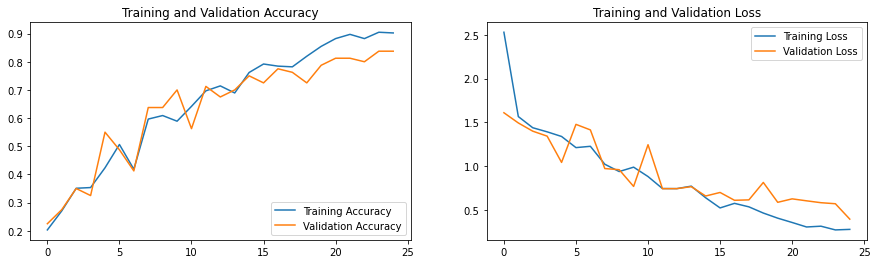

In [ ]:
plot_history(history)

## Observations 
1. This is good model with 90% training and 84% validation accuracy

## Model 7
Increase the number of frames from 15 to 20 

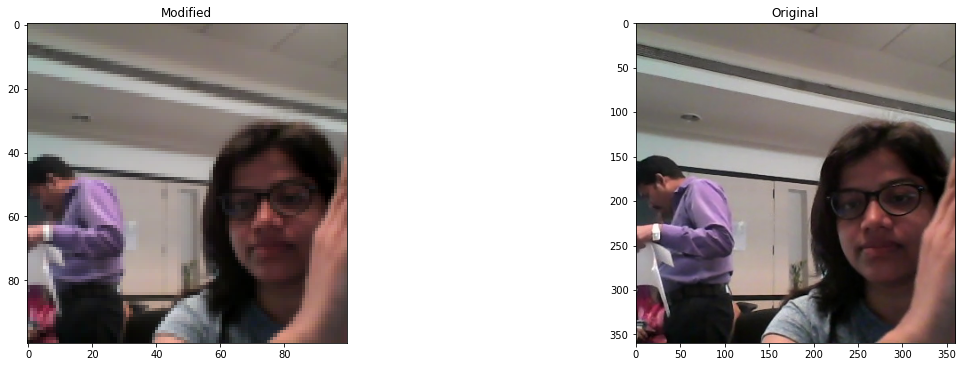

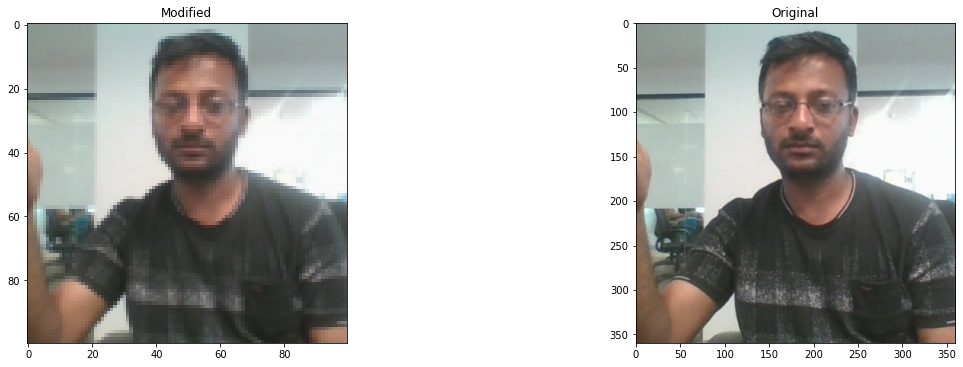

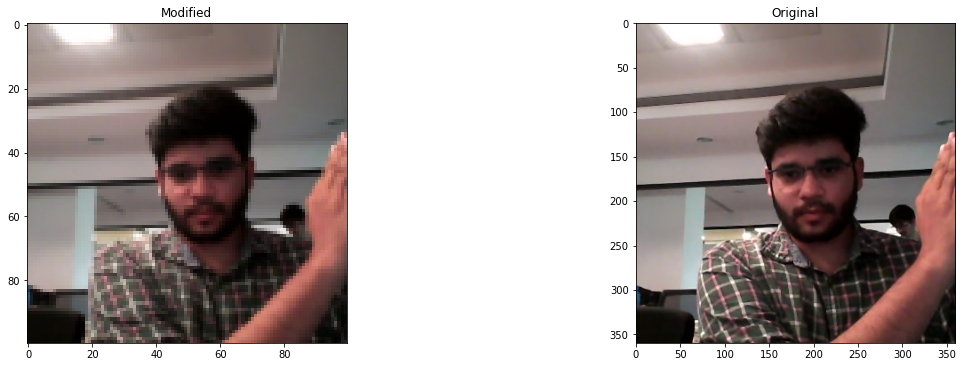

In [ ]:
total_frames = 30
number_of_frames = 20
labels = 5
image_height = 100
image_width = 100
img_idx = np.round(np.linspace(0, total_frames-1, number_of_frames)).astype(int)
batch_size = 5

num_epochs=25

visualize_resize_image(['/tmp/Project_data/train/WIN_20180907_15_35_09_Pro_Right Swipe_new/WIN_20180907_15_35_09_Pro_00012.png','/tmp/Project_data/train/WIN_20180907_15_38_17_Pro_Left Swipe_new_Left Swipe_new/WIN_20180907_15_38_17_Pro_00029.png', '/tmp/Project_data/train/WIN_20180907_15_38_24_Pro_Right Swipe_new/WIN_20180907_15_38_24_Pro_00013.png'])

In [ ]:
from keras.models import Sequential, Model
from keras.layers import Dense, GRU, Flatten, Dropout, TimeDistributed, Flatten, BatchNormalization, Activation
from keras.layers.convolutional import Conv3D, MaxPooling3D
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from keras import optimizers

model = Sequential()

model.add(Conv3D(16, kernel_size=(3,3,3), input_shape=(len(img_idx), image_height, image_width, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Conv3D(32, kernel_size=(3,3,3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Conv3D(64, kernel_size=(3,3,3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.35))

model.add(Dense(128, activation='relu'))
model.add(Dropout(0.35))

#softmax layer
model.add(Dense(labels, activation='softmax'))


In [ ]:
# compile the model with Adam optimizer
optimiser = optimizers.Adam()
model.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
print (model.summary())

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv3d_18 (Conv3D)          (None, 20, 100, 100, 16)  1312      
                                                                 
 batch_normalization_18 (Bat  (None, 20, 100, 100, 16)  64       
 chNormalization)                                                
                                                                 
 activation_18 (Activation)  (None, 20, 100, 100, 16)  0         
                                                                 
 max_pooling3d_18 (MaxPoolin  (None, 10, 50, 50, 16)   0         
 g3D)                                                            
                                                                 
 conv3d_19 (Conv3D)          (None, 10, 50, 50, 32)    13856     
                                                                 
 batch_normalization_19 (Bat  (None, 10, 50, 50, 32)  

In [ ]:
model_name = 'model_exp4_' + str(curr_dt_time).replace(' ','').replace(':','_') + '/'
    
if not os.path.exists(model_name):
    os.mkdir(model_name)
        
filepath = model_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.h5'

checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=False, mode='auto',save_freq = "epoch")

LR = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, cooldown=1, verbose=1) # write the REducelronplateau code here
callbacks_list = [checkpoint, LR]

In [ ]:
if (num_train_sequences%batch_size) == 0:
    steps_per_epoch = int(num_train_sequences/batch_size)
else:
    steps_per_epoch = (num_train_sequences//batch_size) + 1

if (num_val_sequences%batch_size) == 0:
    validation_steps = int(num_val_sequences/batch_size)
else:
    validation_steps = (num_val_sequences//batch_size) + 1

In [ ]:
# fit the model. This will start training the model and with the help of the checkpoints, you'll be able to save the model at the end of each epoch.
history = model.fit(train_generator, steps_per_epoch=steps_per_epoch, epochs=num_epochs, verbose=1, 
                    callbacks=callbacks_list, validation_data=val_generator, 
                    validation_steps=validation_steps, class_weight=None, workers=1, initial_epoch=0)

Epoch 1/25
133/133 [==============================] - ETA: 0s - loss: 2.8794 - categorical_accuracy: 0.2206
Epoch 1: val_loss improved from inf to 1.62567, saving model to model_exp4_2023-01-0509_27_07.310402/model-00001-2.87938-0.22055-1.62567-0.22500.h5
133/133 [==============================] - 90s 675ms/step - loss: 2.8794 - categorical_accuracy: 0.2206 - val_loss: 1.6257 - val_categorical_accuracy: 0.2250 - lr: 0.0010
Epoch 2/25
133/133 [==============================] - ETA: 0s - loss: 1.5284 - categorical_accuracy: 0.3358
Epoch 2: val_loss improved from 1.62567 to 1.52757, saving model to model_exp4_2023-01-0509_27_07.310402/model-00002-1.52842-0.33584-1.52757-0.23750.h5
133/133 [==============================] - 94s 710ms/step - loss: 1.5284 - categorical_accuracy: 0.3358 - val_loss: 1.5276 - val_categorical_accuracy: 0.2375 - lr: 0.0010
Epoch 3/25
133/133 [==============================] - ETA: 0s - loss: 1.4759 - categorical_accuracy: 0.3409
Epoch 3: val_loss improved from 1.

**Training Accuracy:** 0.86%

**Validation Accuracy:** 0.77%

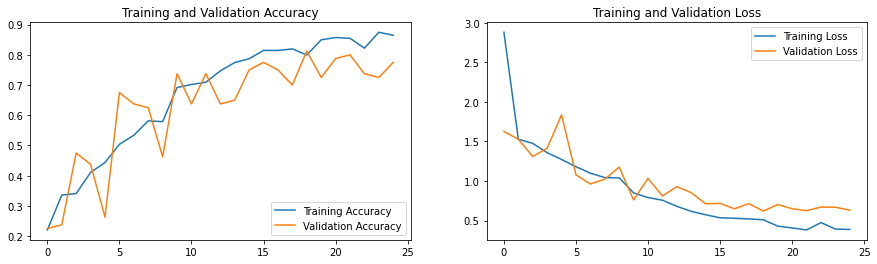

In [ ]:
plot_history(history)

## Observations
1. The validation accuracy has decreased
2. Increasing number of frames results in overfitting

## Model 8
Change the image resolution to (80,80)

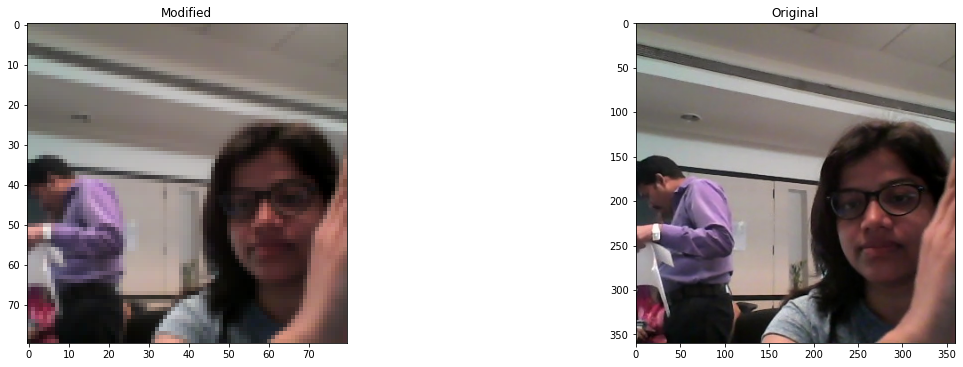

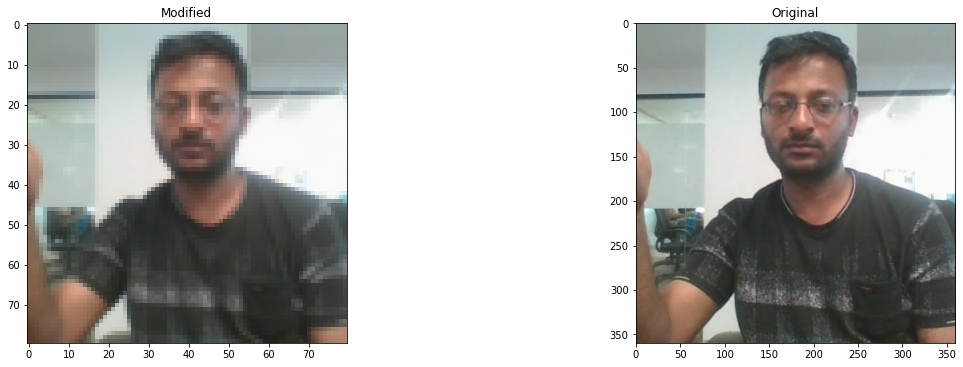

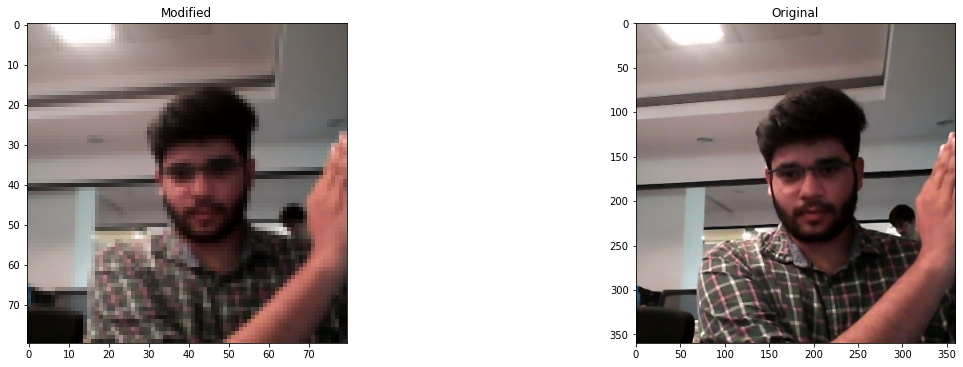

In [ ]:
total_frames = 30
number_of_frames = 15
labels = 5
image_height = 80
image_width = 80
img_idx = np.round(np.linspace(0, total_frames-1, number_of_frames)).astype(int)
batch_size = 5

num_epochs=25

visualize_resize_image(['/tmp/Project_data/train/WIN_20180907_15_35_09_Pro_Right Swipe_new/WIN_20180907_15_35_09_Pro_00012.png','/tmp/Project_data/train/WIN_20180907_15_38_17_Pro_Left Swipe_new_Left Swipe_new/WIN_20180907_15_38_17_Pro_00029.png', '/tmp/Project_data/train/WIN_20180907_15_38_24_Pro_Right Swipe_new/WIN_20180907_15_38_24_Pro_00013.png'])

In [ ]:
from keras.models import Sequential, Model
from keras.layers import Dense, GRU, Flatten, Dropout, TimeDistributed, Flatten, BatchNormalization, Activation
from keras.layers.convolutional import Conv3D, MaxPooling3D
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from keras import optimizers

model = Sequential()

model.add(Conv3D(16, kernel_size=(3,3,3), input_shape=(len(img_idx), image_height, image_width, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Conv3D(32, kernel_size=(3,3,3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Conv3D(64, kernel_size=(3,3,3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.35))

model.add(Dense(128, activation='relu'))
model.add(Dropout(0.35))

#softmax layer
model.add(Dense(labels, activation='softmax'))

In [ ]:
# compile the model with Adam optimizer
optimiser = optimizers.Adam()
model.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
print (model.summary())

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv3d_27 (Conv3D)          (None, 15, 80, 80, 16)    1312      
                                                                 
 batch_normalization_27 (Bat  (None, 15, 80, 80, 16)   64        
 chNormalization)                                                
                                                                 
 activation_27 (Activation)  (None, 15, 80, 80, 16)    0         
                                                                 
 max_pooling3d_27 (MaxPoolin  (None, 7, 40, 40, 16)    0         
 g3D)                                                            
                                                                 
 conv3d_28 (Conv3D)          (None, 7, 40, 40, 32)     13856     
                                                                 
 batch_normalization_28 (Bat  (None, 7, 40, 40, 32)   

In [ ]:
model_name = 'model_exp4_' + str(curr_dt_time).replace(' ','').replace(':','_') + '/'
    
if not os.path.exists(model_name):
    os.mkdir(model_name)
        
filepath = model_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.h5'

checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=False, mode='auto',save_freq = "epoch")

LR = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, cooldown=1, verbose=1) # write the REducelronplateau code here
callbacks_list = [checkpoint, LR]

In [ ]:
if (num_train_sequences%batch_size) == 0:
    steps_per_epoch = int(num_train_sequences/batch_size)
else:
    steps_per_epoch = (num_train_sequences//batch_size) + 1

if (num_val_sequences%batch_size) == 0:
    validation_steps = int(num_val_sequences/batch_size)
else:
    validation_steps = (num_val_sequences//batch_size) + 1

In [ ]:
# fit the model. This will start training the model and with the help of the checkpoints, you'll be able to save the model at the end of each epoch.
history = model.fit(train_generator, steps_per_epoch=steps_per_epoch, epochs=num_epochs, verbose=1, 
                    callbacks=callbacks_list, validation_data=val_generator, 
                    validation_steps=validation_steps, class_weight=None, workers=1, initial_epoch=0)

Epoch 1/25
133/133 [==============================] - ETA: 0s - loss: 2.3752 - categorical_accuracy: 0.2155
Epoch 1: val_loss improved from inf to 1.64083, saving model to model_exp4_2023-01-0509_27_07.310402/model-00001-2.37516-0.21554-1.64083-0.18750.h5
133/133 [==============================] - 71s 531ms/step - loss: 2.3752 - categorical_accuracy: 0.2155 - val_loss: 1.6408 - val_categorical_accuracy: 0.1875 - lr: 0.0010
Epoch 2/25
133/133 [==============================] - ETA: 0s - loss: 1.5013 - categorical_accuracy: 0.3033
Epoch 2: val_loss did not improve from 1.64083
133/133 [==============================] - 69s 524ms/step - loss: 1.5013 - categorical_accuracy: 0.3033 - val_loss: 1.8182 - val_categorical_accuracy: 0.2500 - lr: 0.0010
Epoch 3/25
133/133 [==============================] - ETA: 0s - loss: 1.4445 - categorical_accuracy: 0.3709
Epoch 3: val_loss improved from 1.64083 to 1.55470, saving model to model_exp4_2023-01-0509_27_07.310402/model-00003-1.44453-0.37093-1.5547

**Training Accuracy:** 0.74%

**Validation Accuracy:** 0.73%

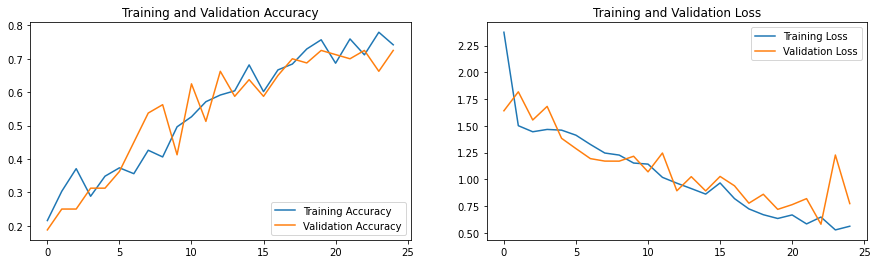

In [ ]:
plot_history(history)

## Observations
1. By decreasing the image resolution the accuracy is decreased
2. There is overfitting or underfitting seen in model

## Model 9
Increase number of epochs to 35

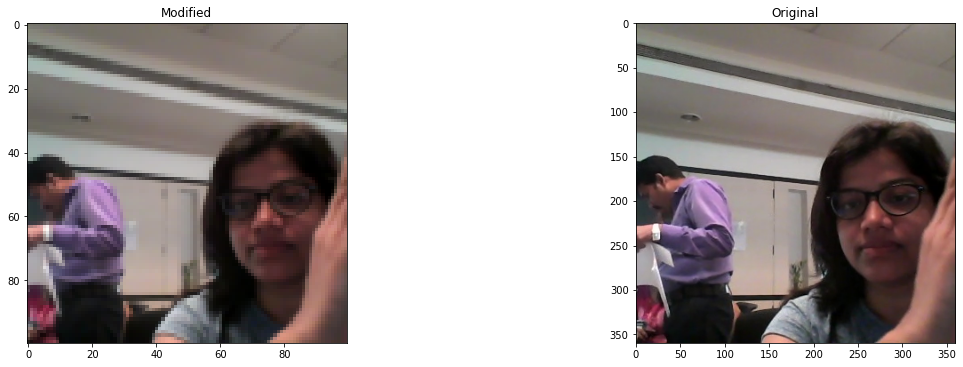

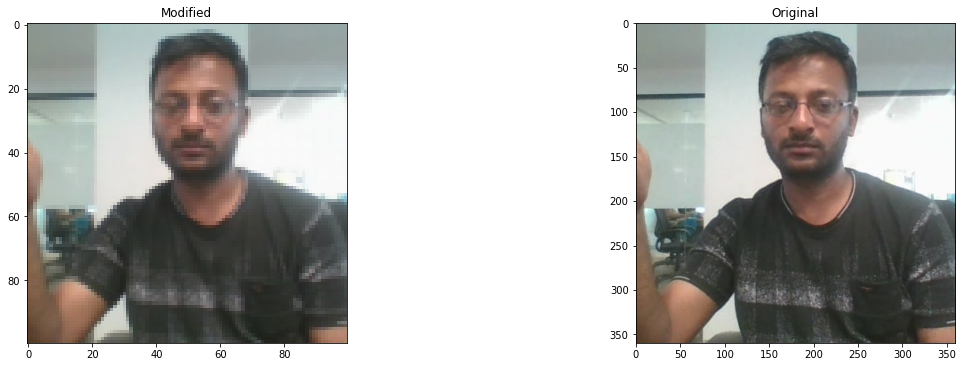

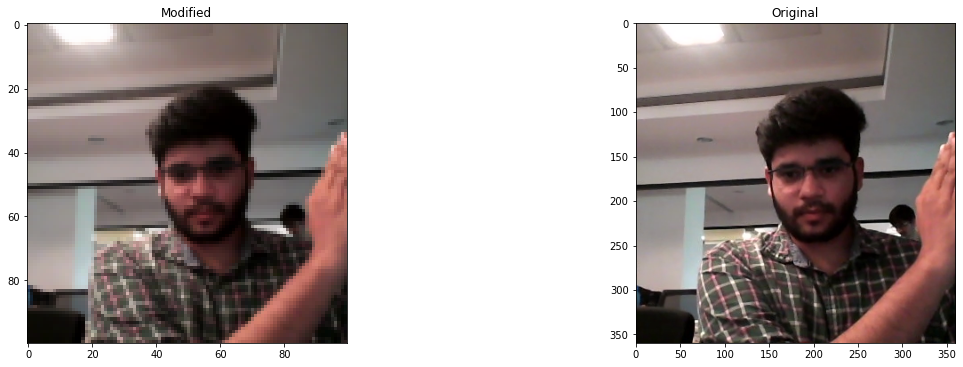

In [ ]:
total_frames = 30
number_of_frames = 15
labels = 5
image_height = 100
image_width = 100
img_idx = np.round(np.linspace(0, total_frames-1, number_of_frames)).astype(int)
batch_size = 5
num_epochs=35
visualize_resize_image(['/tmp/Project_data/train/WIN_20180907_15_35_09_Pro_Right Swipe_new/WIN_20180907_15_35_09_Pro_00012.png','/tmp/Project_data/train/WIN_20180907_15_38_17_Pro_Left Swipe_new_Left Swipe_new/WIN_20180907_15_38_17_Pro_00029.png', '/tmp/Project_data/train/WIN_20180907_15_38_24_Pro_Right Swipe_new/WIN_20180907_15_38_24_Pro_00013.png'])



In [ ]:
from keras.models import Sequential, Model
from keras.layers import Dense, GRU, Flatten, Dropout, TimeDistributed, Flatten, BatchNormalization, Activation
from keras.layers.convolutional import Conv3D, MaxPooling3D
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from keras import optimizers

model = Sequential()
model.add(Conv3D(16, kernel_size=(3,3,3), input_shape=(len(img_idx), image_height, image_width, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Conv3D(32, kernel_size=(3,3,3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Conv3D(64, kernel_size=(3,3,3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling3D(pool_size=(2,2,2)))

model.add(Flatten())

model.add(Dense(128, activation='relu'))
model.add(Dropout(0.35))

model.add(Dense(128, activation='relu'))
model.add(Dropout(0.35))

#softmax layer
model.add(Dense(labels, activation='softmax'))

In [ ]:
# compile the model with adam optimizer
optimiser = optimizers.Adam()
model.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
print (model.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv3d_3 (Conv3D)           (None, 15, 100, 100, 16)  1312      
                                                                 
 batch_normalization_3 (Batc  (None, 15, 100, 100, 16)  64       
 hNormalization)                                                 
                                                                 
 activation_3 (Activation)   (None, 15, 100, 100, 16)  0         
                                                                 
 max_pooling3d_3 (MaxPooling  (None, 7, 50, 50, 16)    0         
 3D)                                                             
                                                                 
 conv3d_4 (Conv3D)           (None, 7, 50, 50, 32)     13856     
                                                                 
 batch_normalization_4 (Batc  (None, 7, 50, 50, 32)   

In [ ]:
train_generator = generator(train_path, train_doc, batch_size)
val_generator = generator(val_path, val_doc, batch_size)

In [ ]:
model_name = 'model_exp4_' + str(curr_dt_time).replace(' ','').replace(':','_') + '/'
    
if not os.path.exists(model_name):
    os.mkdir(model_name)
        
filepath = model_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.h5'
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=False, mode='auto',save_freq = "epoch")
LR = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, cooldown=1, verbose=1) # write the REducelronplateau code here
callbacks_list = [checkpoint, LR]


In [ ]:
if (num_train_sequences%batch_size) == 0:
    steps_per_epoch = int(num_train_sequences/batch_size)
else:
    steps_per_epoch = (num_train_sequences//batch_size) + 1
if (num_val_sequences%batch_size) == 0:
    validation_steps = int(num_val_sequences/batch_size)
else:
    validation_steps = (num_val_sequences//batch_size) + 1

In [ ]:
# fit the model. This will start training the model and with the help of the checkpoints, you'll be able to save the model at the end of each epoch.
history = model.fit(train_generator, steps_per_epoch=steps_per_epoch, epochs=num_epochs, verbose=1, 
                    callbacks=callbacks_list, validation_data=val_generator, 
                    validation_steps=validation_steps, class_weight=None, workers=1, initial_epoch=0)

Source path =  /tmp/Project_data/train ; batch size = 5
Epoch 1/35
133/133 [==============================] - ETA: 0s - loss: 2.2175 - categorical_accuracy: 0.2866Source path =  /tmp/Project_data/val ; batch size = 5

Epoch 1: val_loss improved from inf to 1.78053, saving model to model_exp4_2023-01-0608_42_13.890280/model-00001-2.21747-0.28658-1.78053-0.29000.h5
133/133 [==============================] - 115s 809ms/step - loss: 2.2175 - categorical_accuracy: 0.2866 - val_loss: 1.7805 - val_categorical_accuracy: 0.2900 - lr: 0.0010
Epoch 2/35
133/133 [==============================] - ETA: 0s - loss: 1.5054 - categorical_accuracy: 0.3308
Epoch 2: val_loss improved from 1.78053 to 1.62402, saving model to model_exp4_2023-01-0608_42_13.890280/model-00002-1.50541-0.33083-1.62402-0.23000.h5
133/133 [==============================] - 71s 535ms/step - loss: 1.5054 - categorical_accuracy: 0.3308 - val_loss: 1.6240 - val_categorical_accuracy: 0.2300 - lr: 0.0010
Epoch 3/35
133/133 [===========

**Training Accuracy:** 0.9%

**Validation Accuracy:** 0.78%

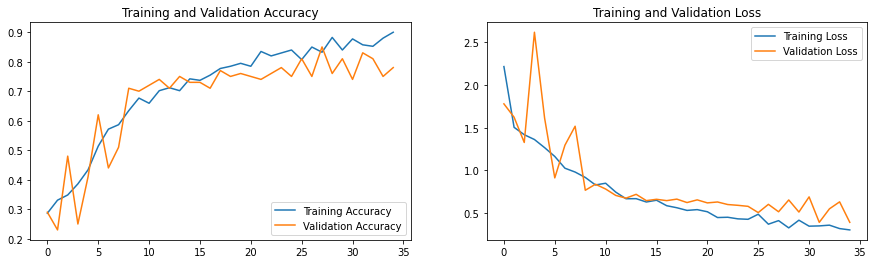

In [ ]:
plot_history(history)

## Observations
1. By increasing number of epochs the model started overfitting
 

## Model 10
CNN with GRU model

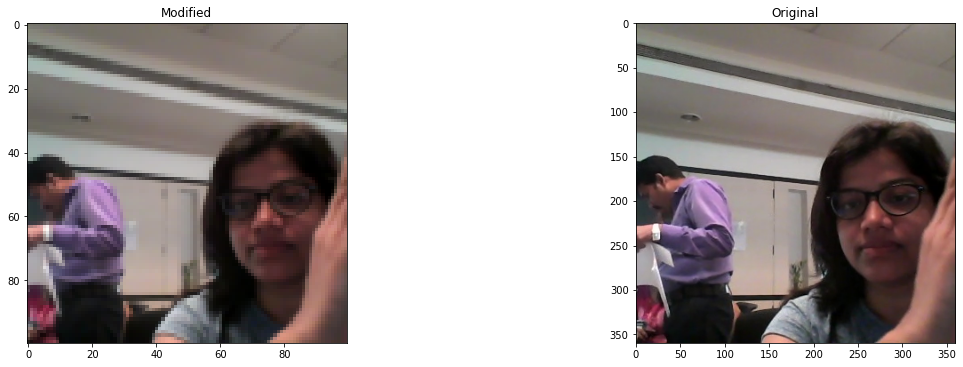

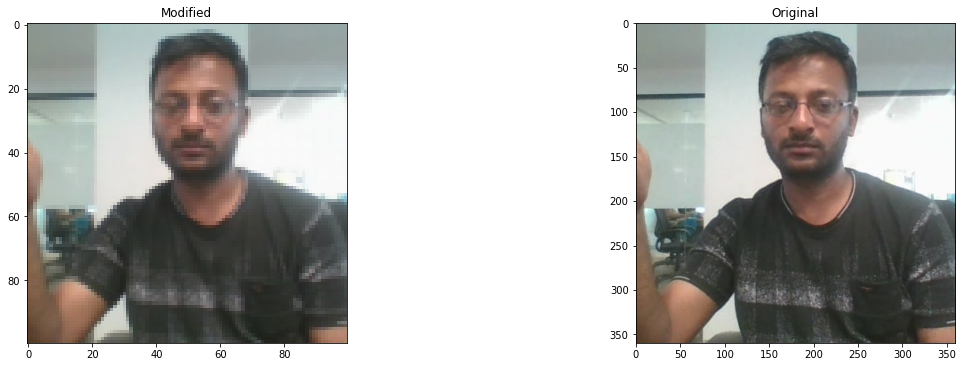

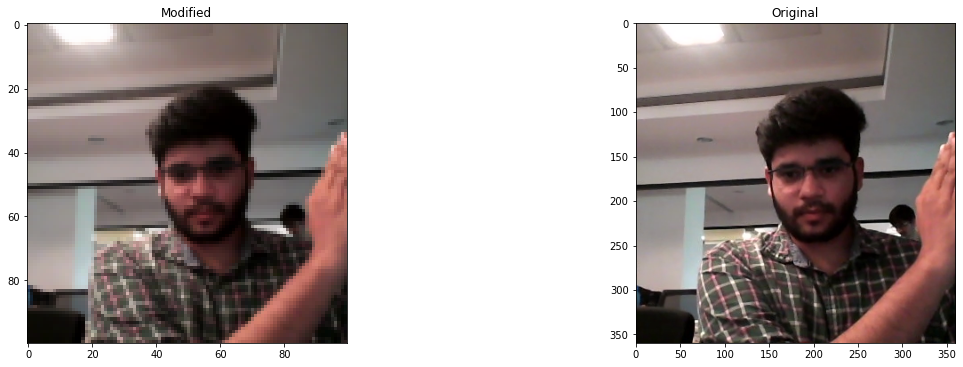

In [ ]:
total_frames = 30
number_of_frames = 15
labels = 5
image_height = 100
image_width = 100
img_idx = np.round(np.linspace(0, total_frames-1, number_of_frames)).astype(int)
batch_size = 5
num_epochs=25
visualize_resize_image(['/tmp/Project_data/train/WIN_20180907_15_35_09_Pro_Right Swipe_new/WIN_20180907_15_35_09_Pro_00012.png','/tmp/Project_data/train/WIN_20180907_15_38_17_Pro_Left Swipe_new_Left Swipe_new/WIN_20180907_15_38_17_Pro_00029.png', '/tmp/Project_data/train/WIN_20180907_15_38_24_Pro_Right Swipe_new/WIN_20180907_15_38_24_Pro_00013.png'])



In [ ]:
from keras.models import Sequential, Model
from keras.layers import Dense, GRU, Flatten, Dropout, TimeDistributed, Flatten, BatchNormalization, Activation
from keras.layers.convolutional import Conv2D, MaxPooling2D
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from keras import optimizers


model = Sequential()

model.add(TimeDistributed(Conv2D(16, (3, 3) , padding='same', activation='relu'),
                          input_shape=(len(img_idx), image_height, image_width, 3)))
model.add(TimeDistributed(BatchNormalization()))
model.add(TimeDistributed(MaxPooling2D((2, 2))))

model.add(TimeDistributed(Conv2D(32, (3, 3) , padding='same', activation='relu')))
model.add(TimeDistributed(BatchNormalization()))
model.add(TimeDistributed(MaxPooling2D((2, 2))))

model.add(TimeDistributed(Conv2D(64, (3, 3) , padding='same', activation='relu')))
model.add(TimeDistributed(BatchNormalization()))
model.add(TimeDistributed(MaxPooling2D((2, 2))))


model.add(TimeDistributed(Flatten()))


model.add(GRU(128))
model.add(Dropout(0.35))

model.add(Dense(128,activation='relu'))
model.add(Dropout(0.35))
model.add(Dense(labels, activation='softmax'))

In [ ]:
# compile the model with adam model
optimiser = optimizers.Adam()
model.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
print (model.summary())


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed (TimeDistr  (None, 15, 100, 100, 16)  448      
 ibuted)                                                         
                                                                 
 time_distributed_1 (TimeDis  (None, 15, 100, 100, 16)  64       
 tributed)                                                       
                                                                 
 time_distributed_2 (TimeDis  (None, 15, 50, 50, 16)   0         
 tributed)                                                       
                                                                 
 time_distributed_3 (TimeDis  (None, 15, 50, 50, 32)   4640      
 tributed)                                                       
                                                                 
 time_distributed_4 (TimeDis  (None, 15, 50, 50, 32)   1

In [ ]:
train_generator = generator(train_path, train_doc, batch_size)
val_generator = generator(val_path, val_doc, batch_size)

In [ ]:
model_name = 'model_exp4_' + str(curr_dt_time).replace(' ','').replace(':','_') + '/'
    
if not os.path.exists(model_name):
    os.mkdir(model_name)
        
filepath = model_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.h5'
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=False, mode='auto',save_freq = "epoch")
LR = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, cooldown=1, verbose=1) # write the REducelronplateau code here
callbacks_list = [checkpoint, LR]


In [ ]:
if (num_train_sequences%batch_size) == 0:
    steps_per_epoch = int(num_train_sequences/batch_size)
else:
    steps_per_epoch = (num_train_sequences//batch_size) + 1
if (num_val_sequences%batch_size) == 0:
    validation_steps = int(num_val_sequences/batch_size)
else:
    validation_steps = (num_val_sequences//batch_size) + 1

In [ ]:
# fit the model. This will start training the model and with the help of the checkpoints, you'll be able to save the model at the end of each epoch.
history = model.fit(train_generator, steps_per_epoch=steps_per_epoch, epochs=num_epochs, verbose=1, 
                    callbacks=callbacks_list, validation_data=val_generator, 
                    validation_steps=validation_steps, class_weight=None, workers=1, initial_epoch=0)



Source path =  /tmp/Project_data/train ; batch size = 5
Epoch 1/25
133/133 [==============================] - ETA: 0s - loss: 1.6483 - categorical_accuracy: 0.3107Source path =  /tmp/Project_data/val ; batch size = 5

Epoch 1: val_loss improved from inf to 2.31501, saving model to model_exp4_2023-01-0610_56_47.657724/model-00001-1.64827-0.31071-2.31501-0.15000.h5
133/133 [==============================] - 118s 814ms/step - loss: 1.6483 - categorical_accuracy: 0.3107 - val_loss: 2.3150 - val_categorical_accuracy: 0.1500 - lr: 0.0010
Epoch 2/25
133/133 [==============================] - ETA: 0s - loss: 1.5626 - categorical_accuracy: 0.3383
Epoch 2: val_loss improved from 2.31501 to 1.75852, saving model to model_exp4_2023-01-0610_56_47.657724/model-00002-1.56260-0.33835-1.75852-0.40000.h5
133/133 [==============================] - 73s 555ms/step - loss: 1.5626 - categorical_accuracy: 0.3383 - val_loss: 1.7585 - val_categorical_accuracy: 0.4000 - lr: 0.0010
Epoch 3/25
133/133 [===========

**Training Accuracy:** 0.71%

**Validation Accuracy:** 0.64%

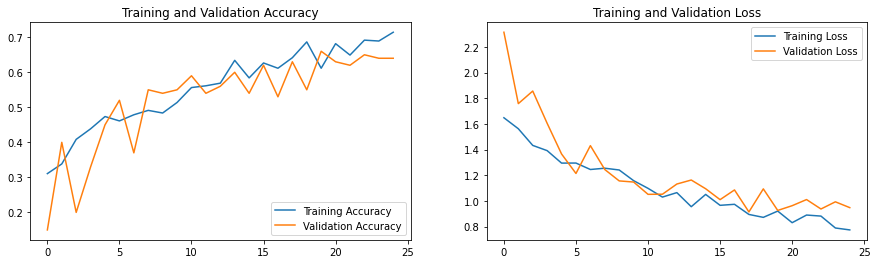

In [ ]:
plot_history(history)

## Observations
1. The training accuracy and validation accuracy obtained is 71% and 64% 

## Model 11
Increase number of convolution layer

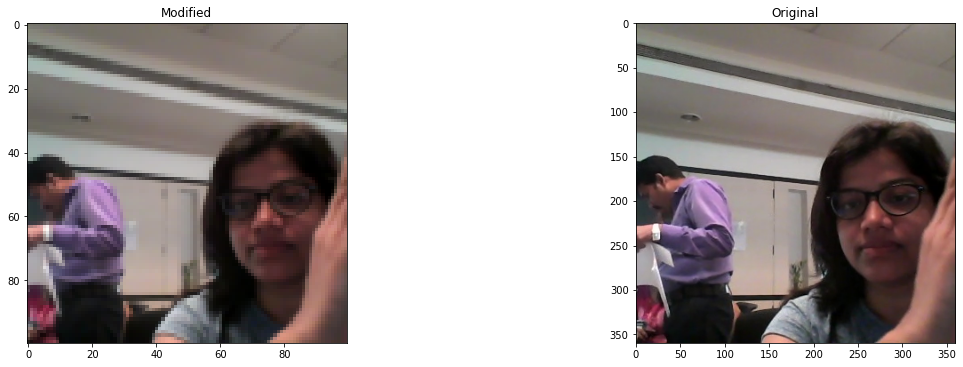

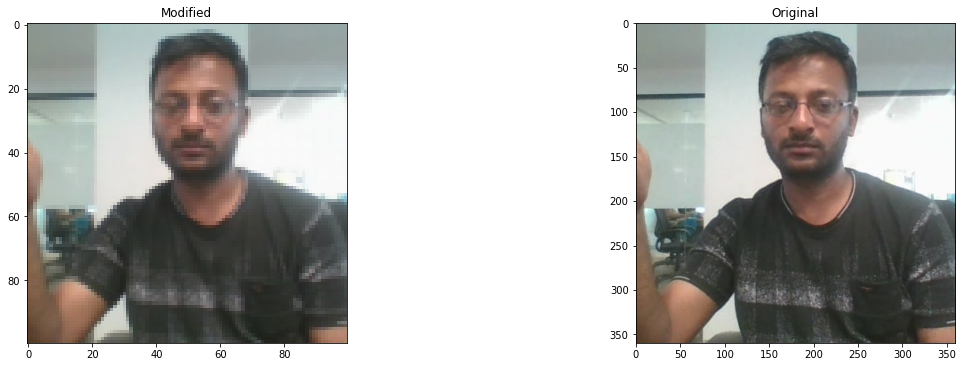

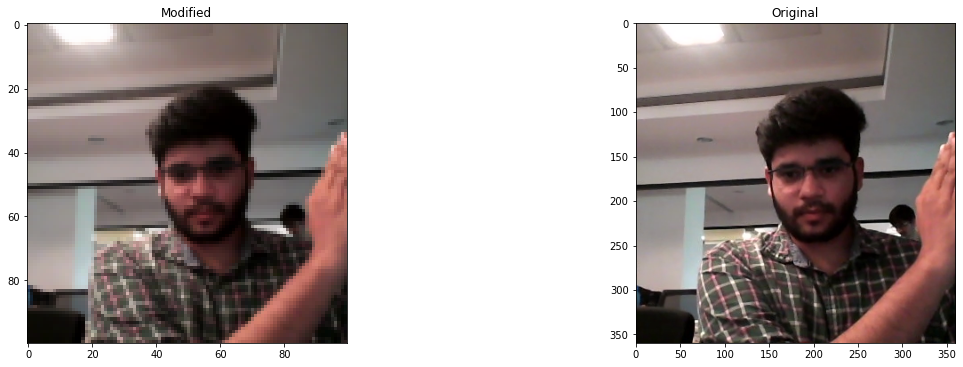

In [ ]:
total_frames = 30
number_of_frames = 15
labels = 5
image_height = 100
image_width = 100
img_idx = np.round(np.linspace(0, total_frames-1, number_of_frames)).astype(int)
batch_size = 5
num_epochs=25
visualize_resize_image(['/tmp/Project_data/train/WIN_20180907_15_35_09_Pro_Right Swipe_new/WIN_20180907_15_35_09_Pro_00012.png','/tmp/Project_data/train/WIN_20180907_15_38_17_Pro_Left Swipe_new_Left Swipe_new/WIN_20180907_15_38_17_Pro_00029.png', '/tmp/Project_data/train/WIN_20180907_15_38_24_Pro_Right Swipe_new/WIN_20180907_15_38_24_Pro_00013.png'])



In [ ]:
from keras.models import Sequential, Model
from keras.layers import Dense, GRU, Flatten, Dropout, TimeDistributed, Flatten, BatchNormalization, Activation
from keras.layers.convolutional import Conv2D, MaxPooling2D
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from keras import optimizers


model = Sequential()

model.add(TimeDistributed(Conv2D(16, (3, 3) , padding='same', activation='relu'),
                          input_shape=(len(img_idx), image_height, image_width, 3)))
model.add(TimeDistributed(BatchNormalization()))
model.add(TimeDistributed(MaxPooling2D((2, 2))))

model.add(TimeDistributed(Conv2D(32, (3, 3) , padding='same', activation='relu')))
model.add(TimeDistributed(BatchNormalization()))
model.add(TimeDistributed(MaxPooling2D((2, 2))))

model.add(TimeDistributed(Conv2D(64, (3, 3) , padding='same', activation='relu')))
model.add(TimeDistributed(BatchNormalization()))
model.add(TimeDistributed(MaxPooling2D((2, 2))))

model.add(TimeDistributed(Conv2D(128, (3, 3) , padding='same', activation='relu')))
model.add(TimeDistributed(BatchNormalization()))
model.add(TimeDistributed(MaxPooling2D((2, 2))))

model.add(TimeDistributed(Flatten()))


model.add(GRU(256))
model.add(Dropout(0.35))

model.add(Dense(256,activation='relu'))
model.add(Dropout(0.35))
model.add(Dense(labels, activation='softmax'))

In [ ]:
# compile the model with Adam optimizer
optimiser = optimizers.Adam()
model.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
print (model.summary())


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_10 (TimeDi  (None, 15, 100, 100, 16)  448      
 stributed)                                                      
                                                                 
 time_distributed_11 (TimeDi  (None, 15, 100, 100, 16)  64       
 stributed)                                                      
                                                                 
 time_distributed_12 (TimeDi  (None, 15, 50, 50, 16)   0         
 stributed)                                                      
                                                                 
 time_distributed_13 (TimeDi  (None, 15, 50, 50, 32)   4640      
 stributed)                                                      
                                                                 
 time_distributed_14 (TimeDi  (None, 15, 50, 50, 32)  

In [ ]:
train_generator = generator(train_path, train_doc, batch_size)
val_generator = generator(val_path, val_doc, batch_size)

In [ ]:
model_name = 'model_exp4_' + str(curr_dt_time).replace(' ','').replace(':','_') + '/'
    
if not os.path.exists(model_name):
    os.mkdir(model_name)
        
filepath = model_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.h5'
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=False, mode='auto',save_freq = "epoch")
LR = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, cooldown=1, verbose=1) # write the REducelronplateau code here
callbacks_list = [checkpoint, LR]


In [ ]:
if (num_train_sequences%batch_size) == 0:
    steps_per_epoch = int(num_train_sequences/batch_size)
else:
    steps_per_epoch = (num_train_sequences//batch_size) + 1
if (num_val_sequences%batch_size) == 0:
    validation_steps = int(num_val_sequences/batch_size)
else:
    validation_steps = (num_val_sequences//batch_size) + 1

In [ ]:
# fit the model. This will start training the model and with the help of the checkpoints, you'll be able to save the model at the end of each epoch.
history = model.fit(train_generator, steps_per_epoch=steps_per_epoch, epochs=num_epochs, verbose=1, 
                    callbacks=callbacks_list, validation_data=val_generator, 
                    validation_steps=validation_steps, class_weight=None, workers=1, initial_epoch=0)



Source path =  /tmp/Project_data/train ; batch size = 5
Epoch 1/25
133/133 [==============================] - ETA: 0s - loss: 1.5999 - categorical_accuracy: 0.3409Source path =  /tmp/Project_data/val ; batch size = 5

Epoch 1: val_loss improved from inf to 2.00898, saving model to model_exp4_2023-01-0610_56_47.657724/model-00001-1.59989-0.34087-2.00898-0.22000.h5
133/133 [==============================] - 107s 787ms/step - loss: 1.5999 - categorical_accuracy: 0.3409 - val_loss: 2.0090 - val_categorical_accuracy: 0.2200 - lr: 0.0010
Epoch 2/25
133/133 [==============================] - ETA: 0s - loss: 1.5052 - categorical_accuracy: 0.3734
Epoch 2: val_loss improved from 2.00898 to 1.81846, saving model to model_exp4_2023-01-0610_56_47.657724/model-00002-1.50519-0.37343-1.81846-0.27000.h5
133/133 [==============================] - 69s 524ms/step - loss: 1.5052 - categorical_accuracy: 0.3734 - val_loss: 1.8185 - val_categorical_accuracy: 0.2700 - lr: 0.0010
Epoch 3/25
133/133 [===========

**Training Accuracy:** 0.83%

**Validation Accuracy:** 0.62%

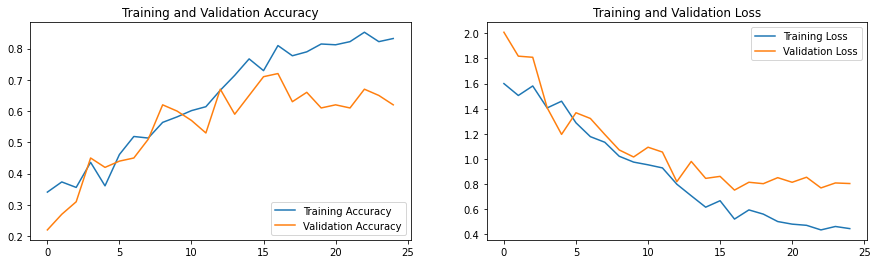

In [ ]:
plot_history(history)

## Observations
1. The model is seen to be overfitting so need to increase dropout value

## Model 12
CNN with GRU increase dropout value

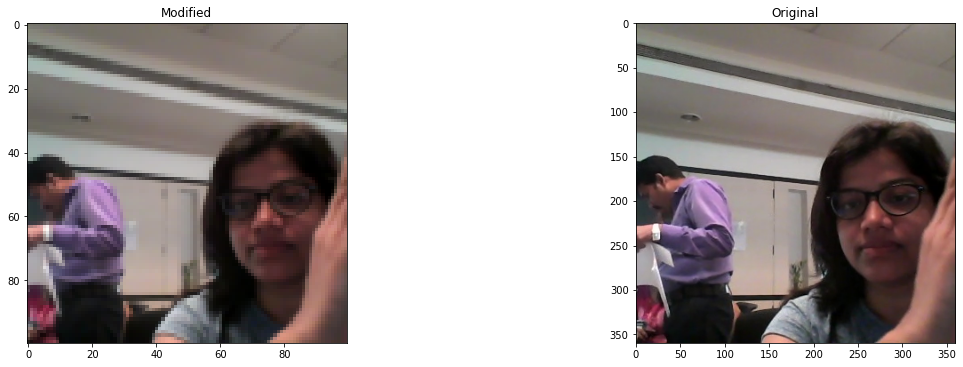

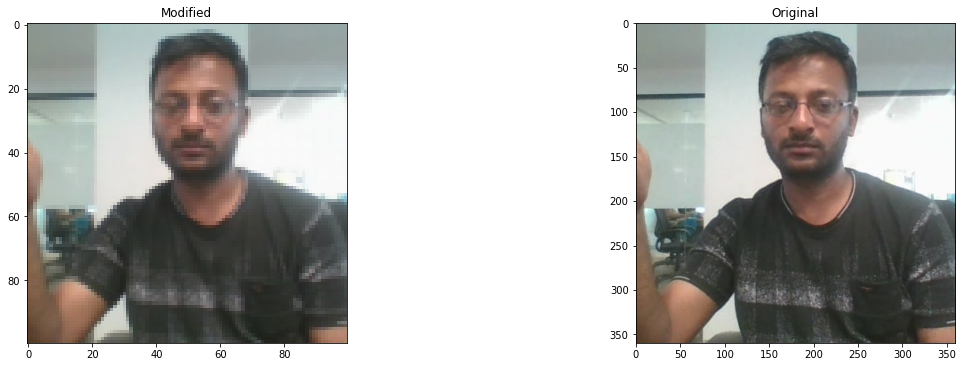

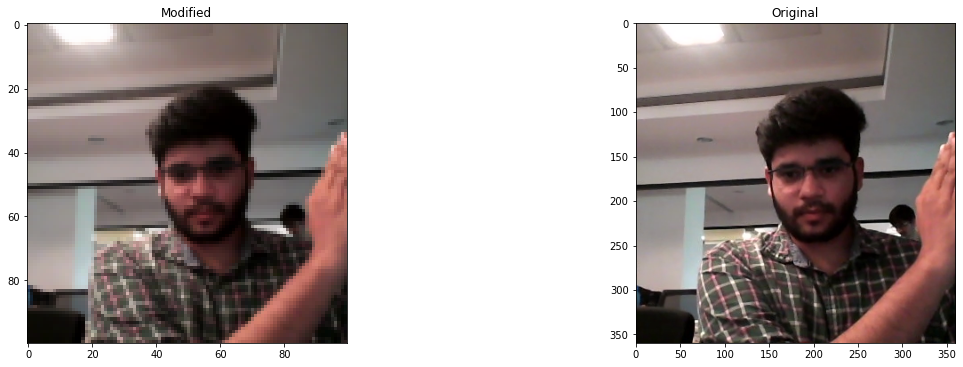

In [ ]:
total_frames = 30
number_of_frames = 15
labels = 5
image_height = 100
image_width = 100
img_idx = np.round(np.linspace(0, total_frames-1, number_of_frames)).astype(int)
batch_size = 5
num_epochs=25
visualize_resize_image(['/tmp/Project_data/train/WIN_20180907_15_35_09_Pro_Right Swipe_new/WIN_20180907_15_35_09_Pro_00012.png','/tmp/Project_data/train/WIN_20180907_15_38_17_Pro_Left Swipe_new_Left Swipe_new/WIN_20180907_15_38_17_Pro_00029.png', '/tmp/Project_data/train/WIN_20180907_15_38_24_Pro_Right Swipe_new/WIN_20180907_15_38_24_Pro_00013.png'])



In [ ]:
from keras.models import Sequential, Model
from keras.layers import Dense, GRU, Flatten, Dropout, TimeDistributed, Flatten, BatchNormalization, Activation
from keras.layers.convolutional import Conv2D, MaxPooling2D
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from keras import optimizers


model = Sequential()

model.add(TimeDistributed(Conv2D(16, (3, 3) , padding='same', activation='relu'),
                          input_shape=(len(img_idx), image_height, image_width, 3)))
model.add(TimeDistributed(BatchNormalization()))
model.add(TimeDistributed(MaxPooling2D((2, 2))))

model.add(TimeDistributed(Conv2D(32, (3, 3) , padding='same', activation='relu')))
model.add(TimeDistributed(BatchNormalization()))
model.add(TimeDistributed(MaxPooling2D((2, 2))))

model.add(TimeDistributed(Conv2D(64, (3, 3) , padding='same', activation='relu')))
model.add(TimeDistributed(BatchNormalization()))
model.add(TimeDistributed(MaxPooling2D((2, 2))))

model.add(TimeDistributed(Conv2D(128, (3, 3) , padding='same', activation='relu')))
model.add(TimeDistributed(BatchNormalization()))
model.add(TimeDistributed(MaxPooling2D((2, 2))))

model.add(TimeDistributed(Flatten()))


model.add(GRU(256))
model.add(Dropout(0.45))

model.add(Dense(256,activation='relu'))
model.add(Dropout(0.45))
model.add(Dense(labels, activation='softmax'))

In [ ]:
optimiser = optimizers.Adam()
model.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
print (model.summary())


Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_68 (TimeDi  (None, 15, 100, 100, 16)  448      
 stributed)                                                      
                                                                 
 time_distributed_69 (TimeDi  (None, 15, 100, 100, 16)  64       
 stributed)                                                      
                                                                 
 time_distributed_70 (TimeDi  (None, 15, 50, 50, 16)   0         
 stributed)                                                      
                                                                 
 time_distributed_71 (TimeDi  (None, 15, 50, 50, 32)   4640      
 stributed)                                                      
                                                                 
 time_distributed_72 (TimeDi  (None, 15, 50, 50, 32)  

In [ ]:
train_generator = generator(train_path, train_doc, batch_size)
val_generator = generator(val_path, val_doc, batch_size)

In [ ]:
model_name = 'model_exp4_' + str(curr_dt_time).replace(' ','').replace(':','_') + '/'
    
if not os.path.exists(model_name):
    os.mkdir(model_name)
        
filepath = model_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.h5'
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=False, mode='auto',save_freq = "epoch")
LR = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, cooldown=1, verbose=1) # write the REducelronplateau code here
callbacks_list = [checkpoint, LR]


In [ ]:
if (num_train_sequences%batch_size) == 0:
    steps_per_epoch = int(num_train_sequences/batch_size)
else:
    steps_per_epoch = (num_train_sequences//batch_size) + 1
if (num_val_sequences%batch_size) == 0:
    validation_steps = int(num_val_sequences/batch_size)
else:
    validation_steps = (num_val_sequences//batch_size) + 1

In [ ]:
# fit the model. This will start training the model and with the help of the checkpoints, you'll be able to save the model at the end of each epoch.
history = model.fit(train_generator, steps_per_epoch=steps_per_epoch, epochs=num_epochs, verbose=1, 
                    callbacks=callbacks_list, validation_data=val_generator, 
                    validation_steps=validation_steps, class_weight=None, workers=1, initial_epoch=0)



Source path =  /tmp/Project_data/train ; batch size = 5
Epoch 1/25
133/133 [==============================] - ETA: 0s - loss: 1.8058 - categorical_accuracy: 0.2640Source path =  /tmp/Project_data/val ; batch size = 5

Epoch 1: val_loss improved from inf to 2.45851, saving model to model_exp4_2023-01-0802_51_06.744779/model-00001-1.80576-0.26395-2.45851-0.21000.h5
133/133 [==============================] - 105s 776ms/step - loss: 1.8058 - categorical_accuracy: 0.2640 - val_loss: 2.4585 - val_categorical_accuracy: 0.2100 - lr: 0.0010
Epoch 2/25
133/133 [==============================] - ETA: 0s - loss: 1.6225 - categorical_accuracy: 0.3383
Epoch 2: val_loss improved from 2.45851 to 1.80590, saving model to model_exp4_2023-01-0802_51_06.744779/model-00002-1.62248-0.33835-1.80590-0.28000.h5
133/133 [==============================] - 71s 541ms/step - loss: 1.6225 - categorical_accuracy: 0.3383 - val_loss: 1.8059 - val_categorical_accuracy: 0.2800 - lr: 0.0010
Epoch 3/25
133/133 [===========

**Training Accuracy:** 0.74%

**Validation Accuracy:** 0.71%

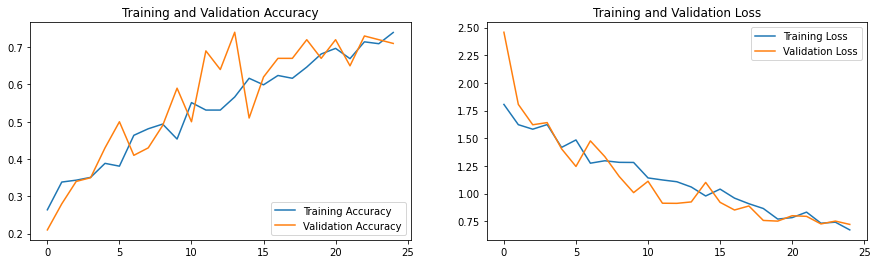

In [ ]:
plot_history(history)

## Observations 
1. Overfitting is reduced by increasing dropout value

## Model 13
**Transfer Learning**

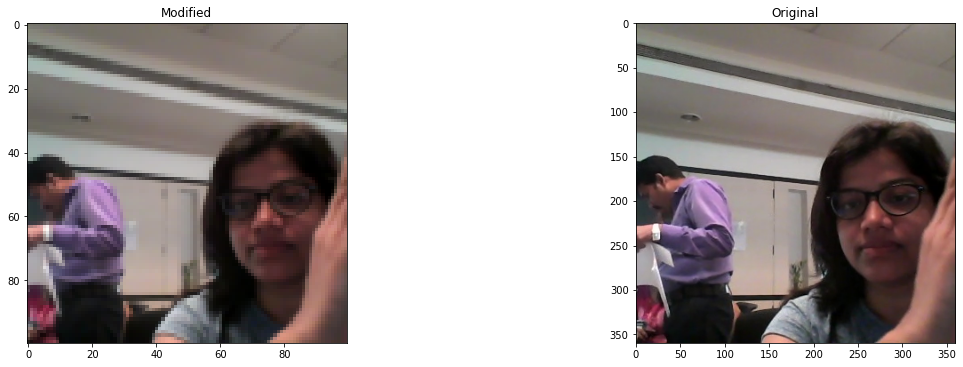

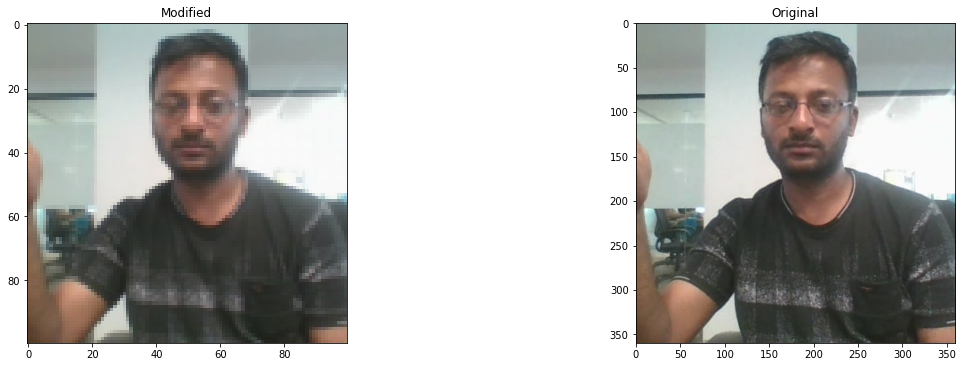

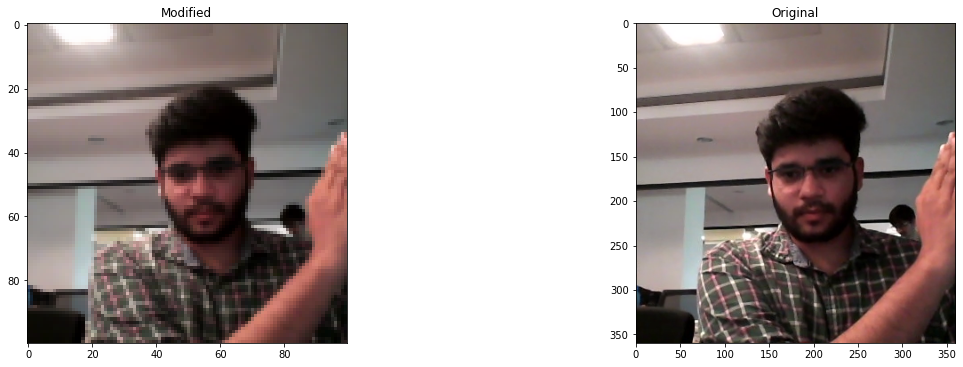

In [48]:
total_frames = 30
number_of_frames = 15
labels = 5
image_height = 100
image_width = 100
img_idx = np.round(np.linspace(0, total_frames-1, number_of_frames)).astype(int)
batch_size = 5
num_epochs=25
visualize_resize_image(['/tmp/Project_data/train/WIN_20180907_15_35_09_Pro_Right Swipe_new/WIN_20180907_15_35_09_Pro_00012.png','/tmp/Project_data/train/WIN_20180907_15_38_17_Pro_Left Swipe_new_Left Swipe_new/WIN_20180907_15_38_17_Pro_00029.png', '/tmp/Project_data/train/WIN_20180907_15_38_24_Pro_Right Swipe_new/WIN_20180907_15_38_24_Pro_00013.png'])



In [49]:
from keras.models import Sequential, Model
from keras.layers import Dense, GRU, Flatten, Dropout, TimeDistributed, Flatten, BatchNormalization, Activation
from keras.layers.convolutional import Conv3D, MaxPooling3D
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from keras import optimizers
from keras.applications import mobilenet

# using transfer learning
mobilenet_transfer = mobilenet.MobileNet(weights='imagenet', include_top=False)

model = Sequential()
model.add(TimeDistributed(mobilenet_transfer,input_shape=(len(img_idx), image_height, image_width, 3)))


model.add(TimeDistributed(BatchNormalization()))
model.add(TimeDistributed(MaxPooling2D((2, 2))))
model.add(TimeDistributed(Flatten()))

model.add(GRU(64))
model.add(Dropout(0.25))

model.add(Dense(64,activation='relu'))
model.add(Dropout(0.25))

model.add(Dense(labels, activation='softmax'))


In [50]:
# compile the model with SGD optimizer
optimiser = optimizers.SGD(lr=0.001, decay=1e-6, momentum=0.7, nesterov=True) 
model.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
print (model.summary())


Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_34 (TimeDi  (None, 15, 3, 3, 1024)   3228864   
 stributed)                                                      
                                                                 
 time_distributed_35 (TimeDi  (None, 15, 3, 3, 1024)   4096      
 stributed)                                                      
                                                                 
 time_distributed_36 (TimeDi  (None, 15, 1, 1, 1024)   0         
 stributed)                                                      
                                                                 
 time_distributed_37 (TimeDi  (None, 15, 1024)         0         
 stributed)                                                      
                                                                 
 gru_2 (GRU)                 (None, 64)               

In [51]:
train_generator = generator(train_path, train_doc, batch_size)
val_generator = generator(val_path, val_doc, batch_size)


In [52]:
model_name = 'model_init' + '_' + str(curr_dt_time).replace(' ','').replace(':','_') + '/'
    
if not os.path.exists(model_name):
    os.mkdir(model_name)
        
filepath = model_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.h5'

checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=False, save_weights_only=False, mode='auto', period=1)

LR = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, cooldown=1, verbose=1) # write the REducelronplateau code
callbacks_list = [checkpoint, LR]

In [53]:
if (num_train_sequences%batch_size) == 0:
    steps_per_epoch = int(num_train_sequences/batch_size)
else:
    steps_per_epoch = (num_train_sequences//batch_size) + 1

if (num_val_sequences%batch_size) == 0:
    validation_steps = int(num_val_sequences/batch_size)
else:
    validation_steps = (num_val_sequences//batch_size) + 1

In [39]:
# fit the model. This will start training the model and with the help of the checkpoints, you'll be able to save the model at the end of each epoch.
history = model.fit(train_generator, steps_per_epoch=steps_per_epoch, epochs=num_epochs, verbose=1, 
                    callbacks=callbacks_list, validation_data=val_generator, 
                    validation_steps=validation_steps, class_weight=None, workers=1, initial_epoch=0)

Source path =  /tmp/Project_data/train ; batch size = 5
Epoch 1/25
133/133 [==============================] - ETA: 0s - loss: 1.6023 - categorical_accuracy: 0.3122Source path =  /tmp/Project_data/val ; batch size = 5

Epoch 1: saving model to model_init_2023-01-1003_24_42.902036/model-00001-1.60230-0.31222-1.28926-0.48000.h5
133/133 [==============================] - 115s 816ms/step - loss: 1.6023 - categorical_accuracy: 0.3122 - val_loss: 1.2893 - val_categorical_accuracy: 0.4800 - lr: 0.0010
Epoch 2/25
133/133 [==============================] - ETA: 0s - loss: 1.3900 - categorical_accuracy: 0.4135
Epoch 2: saving model to model_init_2023-01-1003_24_42.902036/model-00002-1.38995-0.41353-1.07215-0.63000.h5
133/133 [==============================] - 71s 538ms/step - loss: 1.3900 - categorical_accuracy: 0.4135 - val_loss: 1.0721 - val_categorical_accuracy: 0.6300 - lr: 0.0010
Epoch 3/25
133/133 [==============================] - ETA: 0s - loss: 1.2754 - categorical_accuracy: 0.4937
Epoch

**Training Accuracy:** 0.91%

**Validation Accuracy:** 0.85%

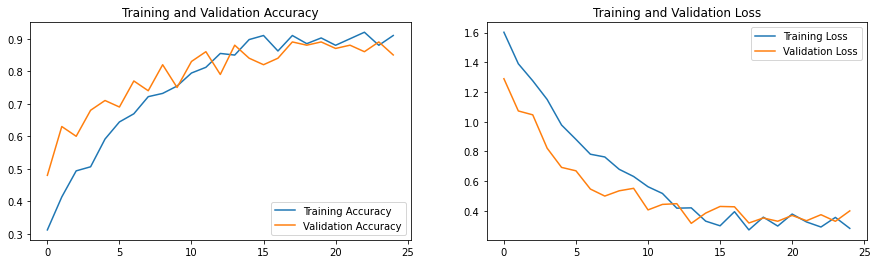

In [40]:
from IPython.display import Markdown, display

# function to visualize training and validation accuracy
def plot_history(history):
    display(Markdown("**Training Accuracy:** " + str(round(history.history['categorical_accuracy'][num_epochs-1], 2)) + "%"))
    display(Markdown("**Validation Accuracy:** " + str(round(history.history['val_categorical_accuracy'][num_epochs-1], 2)) + "%"))
  
    acc = history.history['categorical_accuracy']
    val_acc = history.history['val_categorical_accuracy']

    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs_range = range(num_epochs)

    plt.figure(figsize=(15, 4))
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Training Accuracy')
    plt.plot(epochs_range, val_acc, label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.title('Training and Validation Accuracy')

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Training Loss')
    plt.plot(epochs_range, val_loss, label='Validation Loss')
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')
    plt.show()

plot_history(history)

## Observations
1. The training and validation accuracy obtained is good with SGD optimizer

## Model 14

In [56]:
from keras.models import Sequential, Model
from keras.layers import Dense, GRU, Flatten, Dropout, TimeDistributed, Flatten, BatchNormalization, Activation
from keras.layers.convolutional import Conv3D, MaxPooling3D
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from keras import optimizers
from keras.applications import mobilenet

# using transfer learning
mobilenet_transfer = mobilenet.MobileNet(weights='imagenet', include_top=False)

model = Sequential()
model.add(TimeDistributed(mobilenet_transfer,input_shape=(len(img_idx), image_height, image_width, 3)))


model.add(TimeDistributed(BatchNormalization()))
model.add(TimeDistributed(MaxPooling2D((2, 2))))
model.add(TimeDistributed(Flatten()))

model.add(GRU(64))
model.add(Dropout(0.25))

model.add(Dense(64,activation='relu'))
model.add(Dropout(0.25))

model.add(Dense(labels, activation='softmax'))


In [57]:
# compile the model with Adam optimizer
optimiser = optimizers.Adam() 
model.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
print (model.summary())


Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_38 (TimeDi  (None, 15, 3, 3, 1024)   3228864   
 stributed)                                                      
                                                                 
 time_distributed_39 (TimeDi  (None, 15, 3, 3, 1024)   4096      
 stributed)                                                      
                                                                 
 time_distributed_40 (TimeDi  (None, 15, 1, 1, 1024)   0         
 stributed)                                                      
                                                                 
 time_distributed_41 (TimeDi  (None, 15, 1024)         0         
 stributed)                                                      
                                                                 
 gru_3 (GRU)                 (None, 64)               

In [ ]:
train_generator = generator(train_path, train_doc, batch_size)
val_generator = generator(val_path, val_doc, batch_size)


In [ ]:
model_name = 'model_init' + '_' + str(curr_dt_time).replace(' ','').replace(':','_') + '/'
    
if not os.path.exists(model_name):
    os.mkdir(model_name)
        
filepath = model_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.h5'

checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=False, save_weights_only=False, mode='auto', period=1)

LR = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, cooldown=1, verbose=1) # write the REducelronplateau code
callbacks_list = [checkpoint, LR]

In [ ]:
if (num_train_sequences%batch_size) == 0:
    steps_per_epoch = int(num_train_sequences/batch_size)
else:
    steps_per_epoch = (num_train_sequences//batch_size) + 1

if (num_val_sequences%batch_size) == 0:
    validation_steps = int(num_val_sequences/batch_size)
else:
    validation_steps = (num_val_sequences//batch_size) + 1

In [54]:
# fit the model. This will start training the model and with the help of the checkpoints, you'll be able to save the model at the end of each epoch.
history = model.fit(train_generator, steps_per_epoch=steps_per_epoch, epochs=num_epochs, verbose=1, 
                    callbacks=callbacks_list, validation_data=val_generator, 
                    validation_steps=validation_steps, class_weight=None, workers=1, initial_epoch=0)

Source path =  /tmp/Project_data/train ; batch size = 5
Epoch 1/25
133/133 [==============================] - ETA: 0s - loss: 1.4000 - categorical_accuracy: 0.3831Source path =  /tmp/Project_data/val ; batch size = 5

Epoch 1: saving model to model_init_2023-01-1003_24_42.902036/model-00001-1.39995-0.38311-1.13667-0.55000.h5
133/133 [==============================] - 115s 837ms/step - loss: 1.4000 - categorical_accuracy: 0.3831 - val_loss: 1.1367 - val_categorical_accuracy: 0.5500 - lr: 0.0010
Epoch 2/25
133/133 [==============================] - ETA: 0s - loss: 1.3729 - categorical_accuracy: 0.4536
Epoch 2: saving model to model_init_2023-01-1003_24_42.902036/model-00002-1.37288-0.45363-1.18959-0.58000.h5
133/133 [==============================] - 71s 536ms/step - loss: 1.3729 - categorical_accuracy: 0.4536 - val_loss: 1.1896 - val_categorical_accuracy: 0.5800 - lr: 0.0010
Epoch 3/25
133/133 [==============================] - ETA: 0s - loss: 1.4188 - categorical_accuracy: 0.3810
Epoch

**Training Accuracy:** 0.87%

**Validation Accuracy:** 0.83%

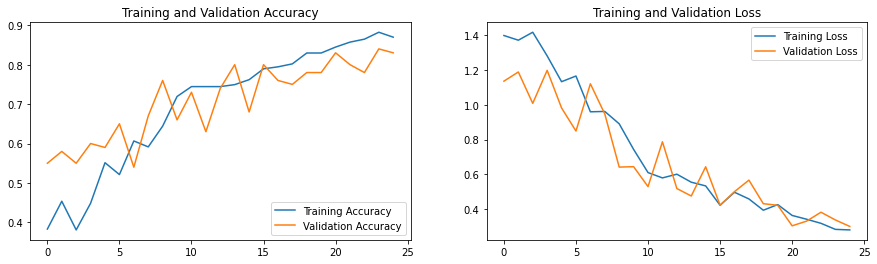

In [55]:
from IPython.display import Markdown, display

# function to visualize training and validation accuracy
def plot_history(history):
    display(Markdown("**Training Accuracy:** " + str(round(history.history['categorical_accuracy'][num_epochs-1], 2)) + "%"))
    display(Markdown("**Validation Accuracy:** " + str(round(history.history['val_categorical_accuracy'][num_epochs-1], 2)) + "%"))
  
    acc = history.history['categorical_accuracy']
    val_acc = history.history['val_categorical_accuracy']

    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs_range = range(num_epochs)

    plt.figure(figsize=(15, 4))
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Training Accuracy')
    plt.plot(epochs_range, val_acc, label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.title('Training and Validation Accuracy')

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Training Loss')
    plt.plot(epochs_range, val_loss, label='Validation Loss')
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')
    plt.show()

plot_history(history)

## **Observations**

1. Model has achieved training accuracy of 90% and validation accuracy of 84%
2. The trainable parameters is equal to 1,267,685 which is less as compared to other models
3. Model is made to overfit. Then overfitting is handled by increasing dropout value in model
4. Conv3D model performs better than CNN + GRU model
5. ReduceLROnPlateau callback helps to reduce learning rate if no change in loss is observed
6. Center cropping is not performed because the information is lost at edges and accuracy obtained was less
